<a href="https://colab.research.google.com/github/MokshithaS/Crop-Disease-Monitoring-System/blob/main/Working_system.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os

# List all files and directories in the current working directory
print("Files and directories in /content:")
print(os.listdir("/content"))


Files and directories in /content:
['.config', 'paddy_disease_model.h5', 'model.weights.h5', 'sample_data']


In [ ]:
import os

dataset_path = "/content"  # Update this if your dataset is in a different directory
print("Files in dataset folder:")
print(os.listdir(dataset_path))


Files in dataset folder:
['.config', 'paddy_disease_model.h5', 'model.weights.h5', 'sample_data']


In [ ]:
import os

# List files in the content directory
print(os.listdir("/content"))


['.config', 'paddy_disease_model.h5', 'model.weights.h5', 'sample_data']


In [ ]:
import h5py

h5_path = "/content/paddy_disease_model.h5"  # Update with your actual file path

with h5py.File(h5_path, 'r') as h5_file:
    print("Keys inside the H5 file:", list(h5_file.keys()))


Keys inside the H5 file: ['model_weights', 'optimizer_weights']


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/Crop disease monitoring system"


 augmented_data        'Copy of Working_system.ipynb'   merged_dataset
 augmented_dataset_v2   filtered_dataset	        train_images


In [ ]:
dataset_path = "/content/drive/My Drive/Crop disease monitoring system/train_images"


In [ ]:
import os

dataset_path = "/content/drive/My Drive/Crop disease monitoring system/train_images"

if os.path.exists(dataset_path):
    print("✅ Dataset found at:", dataset_path)
    print("Classes:", os.listdir(dataset_path))
else:
    print("❌ Dataset not found! Double-check the path.")


✅ Dataset found at: /content/drive/My Drive/Crop disease monitoring system/train_images
Classes: ['bacterial_leaf_streak', 'bacterial_panicle_blight', 'tungro', 'brown_spot', 'dead_heart', 'downy_mildew', 'normal', 'hispa', 'blast', 'bacterial_leaf_blight']


In [ ]:
import shutil
import os

# Define paths
train_images_path = "/content/drive/My Drive/Crop disease monitoring system/train_images"
augmented_data_path = "/content/drive/My Drive/Crop disease monitoring system/augmented_data"

# Merge augmented_data into train_images
for category in os.listdir(augmented_data_path):  # Assuming categories are in subfolders
    source_dir = os.path.join(augmented_data_path, category)
    target_dir = os.path.join(train_images_path, category)

    # Ensure target category directory exists
    os.makedirs(target_dir, exist_ok=True)

    # Move files
    for file_name in os.listdir(source_dir):
        src_file = os.path.join(source_dir, file_name)
        dest_file = os.path.join(target_dir, file_name)

        # Avoid overwriting
        if not os.path.exists(dest_file):
            shutil.move(src_file, dest_file)

print("✅ Merging completed successfully!")


✅ Merging completed successfully!


In [ ]:
for category in os.listdir(train_images_path):
    num_files = len(os.listdir(os.path.join(train_images_path, category)))
    print(f"{category}: {num_files} images")


bacterial_leaf_streak: 530 images
bacterial_panicle_blight: 487 images
tungro: 1238 images
brown_spot: 1115 images
dead_heart: 1592 images
downy_mildew: 770 images
normal: 1914 images
hispa: 1744 images
blast: 1888 images
bacterial_leaf_blight: 629 images


In [ ]:
merged_dataset_dir = "/content/drive/MyDrive/Crop disease monitoring system/train_images"


In [ ]:
import os

base_path = "/content/drive/My Drive/Crop disease monitoring system"
print("Folders inside 'Crop disease monitoring system':")
print(os.listdir(base_path))


Folders inside 'Crop disease monitoring system':
['train_images', 'augmented_data', 'filtered_dataset']


In [ ]:
import shutil
import os

# Paths
merged_dataset_dir = "/content/drive/My Drive/Crop disease monitoring system/train_images"
filtered_dataset_dir = "/content/drive/My Drive/Crop disease monitoring system/filtered_dataset"

# Classes to remove
remove_classes = {"bacterial_leaf_streak", "bacterial_panicle_blight", "downy_mildew", "bacterial_leaf_blight"}

# Ensure the filtered dataset directory exists
os.makedirs(filtered_dataset_dir, exist_ok=True)

for class_name in os.listdir(merged_dataset_dir):
    class_path = os.path.join(merged_dataset_dir, class_name)

    if class_name in remove_classes:
        print(f"🚫 Removing class: {class_name}")
        shutil.rmtree(class_path)  # Delete the unwanted class folder
    else:
        print(f"✅ Keeping class: {class_name}")
        dest_class_path = os.path.join(filtered_dataset_dir, class_name)
        os.makedirs(dest_class_path, exist_ok=True)

        for img_file in os.listdir(class_path):
            src_file = os.path.join(class_path, img_file)
            dest_file = os.path.join(dest_class_path, img_file)
            shutil.copy2(src_file, dest_file)  # Copy remaining classes to new dataset

print("✅ Unwanted classes removed. Final dataset saved at:", filtered_dataset_dir)


🚫 Removing class: bacterial_leaf_streak
🚫 Removing class: bacterial_panicle_blight
✅ Keeping class: tungro
✅ Keeping class: brown_spot
✅ Keeping class: dead_heart
🚫 Removing class: downy_mildew
✅ Keeping class: normal
✅ Keeping class: hispa
✅ Keeping class: blast
🚫 Removing class: bacterial_leaf_blight
✅ Unwanted classes removed. Final dataset saved at: /content/drive/My Drive/Crop disease monitoring system/filtered_dataset


In [ ]:
import tensorflow as tf
print("✅ TensorFlow is using:", tf.config.list_physical_devices('GPU'))


✅ TensorFlow is using: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
filtered_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/filtered_dataset"


In [ ]:
!fusermount -u /content/drive
!rm -rf /content/drive


fusermount: failed to unmount /content/drive: No such file or directory


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/filtered_dataset"

if os.path.exists(dataset_path):
    print("✅ filtered_dataset found!")
    print("Classes inside filtered_dataset:", os.listdir(dataset_path))
else:
    print("❌ filtered_dataset not found! Check folder name again.")


✅ filtered_dataset found!
Classes inside filtered_dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
import os
import shutil
import cv2
import numpy as np
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
filtered_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/filtered_dataset"
augmented_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_dataset_v2"

# Create the directory for augmented data if it doesn't exist
os.makedirs(augmented_dataset_path, exist_ok=True)

# Augmentation settings
datagen = ImageDataGenerator(
    rotation_range=30,        # Rotate images up to 30 degrees
    width_shift_range=0.2,    # Shift width up to 20%
    height_shift_range=0.2,   # Shift height up to 20%
    shear_range=0.2,          # Shear transform
    zoom_range=0.2,           # Zoom in and out
    horizontal_flip=True,     # Flip horizontally
    brightness_range=[0.8, 1.2],  # Adjust brightness
    fill_mode='nearest'
)

# Apply augmentation to each class
for class_name in os.listdir(filtered_dataset_path):
    class_path = os.path.join(filtered_dataset_path, class_name)
    augmented_class_path = os.path.join(augmented_dataset_path, class_name)
    os.makedirs(augmented_class_path, exist_ok=True)

    print(f"📸 Augmenting images for class: {class_name}...")

    # Process images
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = np.expand_dims(img, axis=0)

        # Generate and save 5 augmented images per original image
        i = 0
        for batch in datagen.flow(img, batch_size=4, save_to_dir=augmented_class_path,
                                  save_prefix="aug", save_format="jpg"):
            i += 1
            if i >= 3:  # Number of augmentations per image
                break

print("🎉 Augmentation completed successfully! 🚀")


📸 Augmenting images for class: tungro...
📸 Augmenting images for class: brown_spot...
📸 Augmenting images for class: dead_heart...
📸 Augmenting images for class: normal...
📸 Augmenting images for class: hispa...
📸 Augmenting images for class: blast...
🎉 Augmentation completed successfully! 🚀


In [ ]:
import os
import shutil
from tqdm import tqdm

# Paths
filtered_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/filtered_dataset"
augmented_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_dataset_v2"
merged_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/merged_dataset"

# Create merged dataset directory
os.makedirs(merged_dataset_path, exist_ok=True)

# Merge function
def merge_datasets():
    for dataset_path in [filtered_dataset_path, augmented_dataset_path]:
        for class_name in os.listdir(dataset_path):
            class_path = os.path.join(dataset_path, class_name)
            merged_class_path = os.path.join(merged_dataset_path, class_name)
            os.makedirs(merged_class_path, exist_ok=True)

            # Copy images to merged dataset
            for img_name in tqdm(os.listdir(class_path), desc=f"Merging {class_name}"):
                src_path = os.path.join(class_path, img_name)
                dest_path = os.path.join(merged_class_path, img_name)
                shutil.copy2(src_path, dest_path)

    print("✅ Merge completed successfully! 🚀")

# Run merge
merge_datasets()


Merging blast: 100%|██████████| 4362/4362 [01:48<00:00, 40.31it/s]

✅ Merge completed successfully! 🚀


In [ ]:
for class_name in os.listdir(merged_dataset_path):
    num_files = len(os.listdir(os.path.join(merged_dataset_path, class_name)))
    print(f"{class_name}: {num_files} images after merging")


tungro: 8548 images after merging
brown_spot: 4867 images after merging
dead_heart: 5370 images after merging
normal: 6269 images after merging
hispa: 5782 images after merging
blast: 6250 images after merging


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
merged_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/merged_dataset"

if os.path.exists(merged_dataset_path):
    print("✅ merged_dataset found!")
    print("Classes inside merged_dataset:", os.listdir(merged_dataset_path))
else:
    print("❌ merged_dataset not found! Check the folder name.")


✅ merged_dataset found!
Classes inside merged_dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
import tensorflow as tf
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm

# Paths
preprocessed_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Create preprocessed dataset directory
os.makedirs(preprocessed_dataset_path, exist_ok=True)

# Image size for Vision Transformer
IMG_SIZE = 224

# Function to preprocess and save images
def preprocess_and_save():
    for class_name in os.listdir(merged_dataset_path):
        class_path = os.path.join(merged_dataset_path, class_name)
        preprocessed_class_path = os.path.join(preprocessed_dataset_path, class_name)
        os.makedirs(preprocessed_class_path, exist_ok=True)

        print(f"📸 Preprocessing images for class: {class_name}...")

        for img_name in tqdm(os.listdir(class_path)):
            img_path = os.path.join(class_path, img_name)

            # Load and resize image
            img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize pixel values
            img_array = np.array(img_array, dtype=np.float32)

            # Save preprocessed image
            save_path = os.path.join(preprocessed_class_path, img_name)
            np.save(save_path, img_array)

    print("✅ Preprocessing completed successfully! 🚀")

# Run preprocessing
preprocess_and_save()


📸 Preprocessing images for class: tungro...


100%|██████████| 8548/8548 [07:14<00:00, 19.66it/s]


📸 Preprocessing images for class: brown_spot...


100%|██████████| 4867/4867 [08:50<00:00,  9.18it/s]


📸 Preprocessing images for class: dead_heart...


100%|██████████| 5370/5370 [08:30<00:00, 10.53it/s]


📸 Preprocessing images for class: normal...


100%|██████████| 6269/6269 [07:11<00:00, 14.53it/s]


📸 Preprocessing images for class: hispa...


100%|██████████| 5782/5782 [06:12<00:00, 15.54it/s]


📸 Preprocessing images for class: blast...


  4%|▍         | 269/6250 [03:45<1:23:24,  1.20it/s]


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7aba6a8b38d0>

In [ ]:
import os
from PIL import Image

corrupt_images = []
class_path = "/content/drive/MyDrive/Crop disease monitoring system/merged_dataset/blast"

for img_name in os.listdir(class_path):
    img_path = os.path.join(class_path, img_name)
    try:
        img = Image.open(img_path)  # Try opening the image
        img.verify()  # Verify if it's a valid image
    except Exception as e:
        corrupt_images.append(img_name)

print(f"❌ Found {len(corrupt_images)} corrupt images in 'blast' class:")
print(corrupt_images)


❌ Found 1 corrupt images in 'blast' class:
['aug_0_332.jpg']


In [ ]:
def preprocess_and_save():
    for class_name in os.listdir(merged_dataset_path):
        class_path = os.path.join(merged_dataset_path, class_name)
        preprocessed_class_path = os.path.join(preprocessed_dataset_path, class_name)
        os.makedirs(preprocessed_class_path, exist_ok=True)

        print(f"📸 Preprocessing images for class: {class_name}...")

        for img_name in tqdm(os.listdir(class_path)):
            img_path = os.path.join(class_path, img_name)

            try:
                # Load and resize image
                img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
                img_array = img_to_array(img) / 255.0  # Normalize pixel values
                img_array = np.array(img_array, dtype=np.float32)

                # Save preprocessed image
                save_path = os.path.join(preprocessed_class_path, img_name)
                np.save(save_path, img_array)

            except Exception as e:
                print(f"⚠️ Skipping corrupt file: {img_name} - {e}")

    print("✅ Preprocessing completed successfully! 🚀")


In [ ]:
import os

preprocessed_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

print("📂 Checking preprocessed dataset...")

for class_name in os.listdir(preprocessed_dataset_path):
    class_path = os.path.join(preprocessed_dataset_path, class_name)
    num_files = len(os.listdir(class_path))
    print(f"{class_name}: {num_files} preprocessed images ✅")


📂 Checking preprocessed dataset...
tungro: 8548 preprocessed images ✅
brown_spot: 4867 preprocessed images ✅
dead_heart: 5370 preprocessed images ✅
normal: 6269 preprocessed images ✅
hispa: 5782 preprocessed images ✅
blast: 269 preprocessed images ✅


In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm

# Paths
blast_class_path = "/content/drive/MyDrive/Crop disease monitoring system/merged_dataset/blast"
augmented_blast_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_blast"

# Create the directory if it doesn’t exist
os.makedirs(augmented_blast_path, exist_ok=True)

# Augmentation settings
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# Generate more images for blast
existing_images = os.listdir(blast_class_path)
target_images = 5000  # Aim for ~5000 images

for img_name in tqdm(existing_images, desc="Generating Blast Augmented Images"):
    img_path = os.path.join(blast_class_path, img_name)
    img = cv2.imread(img_path)

    if img is None:
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.expand_dims(img, axis=0)

    i = 0
    for batch in datagen.flow(img, batch_size=1, save_to_dir=augmented_blast_path,
                              save_prefix="aug_blast", save_format="jpg"):
        i += 1
        if i >= (target_images // len(existing_images)):  # Distribute augmentation
            break

print("✅ Blast dataset augmented successfully! 🚀")


Generating Blast Augmented Images: 100%|██████████| 6250/6250 [16:35<00:00,  6.28it/s]

✅ Blast dataset augmented successfully! 🚀


In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm

# Paths
augmented_blast_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_blast"
preprocessed_blast_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/blast"

# Create directory if it doesn't exist
os.makedirs(preprocessed_blast_path, exist_ok=True)

# Image size for Vision Transformer
IMG_SIZE = 224

# Preprocess and save augmented blast images
def preprocess_blast():
    print(f"📸 Preprocessing augmented Blast images...")

    for img_name in tqdm(os.listdir(augmented_blast_path)):
        img_path = os.path.join(augmented_blast_path, img_name)

        try:
            # Load and resize image
            img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize pixel values
            img_array = np.array(img_array, dtype=np.float32)

            # Save preprocessed image
            save_path = os.path.join(preprocessed_blast_path, img_name)
            np.save(save_path, img_array)

        except Exception as e:
            print(f"⚠️ Skipping corrupt file: {img_name} - {e}")

    print("✅ Augmented Blast images preprocessed successfully! 🚀")

# Run preprocessing
preprocess_blast()


📸 Preprocessing augmented Blast images...


100%|██████████| 4674/4674 [04:24<00:00, 17.68it/s]

✅ Augmented Blast images preprocessed successfully! 🚀


In [ ]:
preprocessed_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

print("📂 Final preprocessed dataset count:")

for class_name in os.listdir(preprocessed_dataset_path):
    class_path = os.path.join(preprocessed_dataset_path, class_name)
    num_files = len(os.listdir(class_path))
    print(f"{class_name}: {num_files} preprocessed images ✅")


📂 Final preprocessed dataset count:
tungro: 8548 preprocessed images ✅
brown_spot: 4867 preprocessed images ✅
dead_heart: 5370 preprocessed images ✅
normal: 6269 preprocessed images ✅
hispa: 5782 preprocessed images ✅
blast: 4943 preprocessed images ✅


In [ ]:
!pip install tensorflow numpy transformers torch timm


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Input, Dense, LSTM, GRU, Dropout, Attention, LayerNormalization, Reshape
from tensorflow.keras.models import Model
from transformers import ViTModel, ViTConfig
import torch


In [ ]:
# Load ViT model
vit_model_name = "google/vit-base-patch16-224-in21k"
vit = ViTModel.from_pretrained(vit_model_name)

# Freeze ViT layers to use as feature extractor
for param in vit.parameters():
    param.requires_grad = False


In [ ]:
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights


In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Lambda, Layer, GlobalAveragePooling1D
from tensorflow.keras.models import Model

# ✅ Load TensorFlow-Compatible Vision Transformer (ViT)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Ensure ViT Processes the Input Correctly
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# ✅ Define the Full Model (ViT + RNN + Attention)
def build_vit_rnn_attention_model():
    input_layer = Input(shape=(224, 224, 3))

    # ✅ ViT Feature Extraction (Ensures Proper Tensor Handling)
    vit_features = Lambda(vit_feature_extractor)(input_layer)  # Wrap ViT in Lambda
    # x = Reshape((197, 768))(vit_features)  # 197 patches, 768 features
    # ✅ Use GlobalAveragePooling1D to convert ViT output to the correct shape for LSTM
    # x = GlobalAveragePooling1D()(vit_features) #This line is causing the error
    # x = Reshape((1, 768))(x)  # Reshape for LSTM input
    x = Reshape((1, 768))(vit_features)  # Reshape for LSTM input

    # ✅ Attention Layer
    x = AttentionLayer()(x)

    # ✅ RNN (LSTM)
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Fully Connected Layers
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    model = Model(inputs=input_layer, outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Build the Model
model = build_vit_rnn_attention_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_3 (Lambda)                    │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 1, 768)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_layer (AttentionLayer)     │ (None, 1, 768)              │         590,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 1, 128)              │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,108,358 (4.23 MB)

 Trainable params: 1,108,358 (4.23 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
preprocessed_data_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 80% training, 20% validation
)

# Training Data (80%)
train_data = train_datagen.flow_from_directory(
    preprocessed_data_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# Validation Data (20%)
val_data = train_datagen.flow_from_directory(
    preprocessed_data_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

# ✅ Summary
print(f"✅ Loaded {train_data.samples} training samples")
print(f"✅ Loaded {val_data.samples} validation samples")


Found 0 images belonging to 6 classes.
Found 0 images belonging to 6 classes.
✅ Loaded 0 training samples
✅ Loaded 0 validation samples


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

if os.path.exists(dataset_path):
    print("✅ Dataset found!")
    print("📂 Classes:", os.listdir(dataset_path))
else:
    print("❌ Dataset not found! Check the path.")


✅ Dataset found!
📂 Classes: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
print(f"📂 Training samples: {train_data.samples}")
print(f"📂 Validation samples: {val_data.samples}")

if train_data.samples == 0 or val_data.samples == 0:
    print("❌ ERROR: No images loaded! Check dataset path or structure.")


📂 Training samples: 6870
📂 Validation samples: 1716


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

if os.path.exists(dataset_path):
    print("✅ Dataset found!")
    print("📂 Classes:", os.listdir(dataset_path))
else:
    print("❌ Dataset not found! Check the path.")


✅ Dataset found!
📂 Classes: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        print(f"📂 Class: {class_name} → {num_images} images")


📂 Class: tungro → 9836 images
📂 Class: brown_spot → 4905 images
📂 Class: dead_heart → 5370 images
📂 Class: normal → 6269 images
📂 Class: hispa → 5782 images
📂 Class: blast → 4943 images


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

val_data = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

print(f"✅ Loaded {train_data.samples} training samples")
print(f"✅ Loaded {val_data.samples} validation samples")


Found 6870 images belonging to 6 classes.
Found 1716 images belonging to 6 classes.
✅ Loaded 6870 training samples
✅ Loaded 1716 validation samples


In [ ]:
import os

valid_extensions = (".jpg", ".jpeg", ".png")

for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        images = [f for f in os.listdir(class_path) if f.lower().endswith(valid_extensions)]
        print(f"📂 {class_name}: {len(images)} valid images")


📂 tungro: 8548 valid images
📂 brown_spot: 38 valid images
📂 dead_heart: 0 valid images
📂 normal: 0 valid images
📂 hispa: 0 valid images
📂 blast: 0 valid images


In [ ]:
import os

for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        npy_files = [f for f in os.listdir(class_path) if f.endswith(".npy")]
        print(f"📂 {class_name}: {len(npy_files)} `.npy` files found")


📂 tungro: 1288 `.npy` files found
📂 brown_spot: 4867 `.npy` files found
📂 dead_heart: 5370 `.npy` files found
📂 normal: 6269 `.npy` files found
📂 hispa: 5782 `.npy` files found
📂 blast: 4943 `.npy` files found


In [ ]:
import numpy as np
import os
from tensorflow.keras.preprocessing.image import array_to_img
from tqdm import tqdm  # Progress bar

# Convert .npy files to images
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        npy_files = [f for f in os.listdir(class_path) if f.endswith(".npy")]

        print(f"📂 Converting {len(npy_files)} `.npy` files in class: {class_name}")

        for npy_file in tqdm(npy_files):
            npy_path = os.path.join(class_path, npy_file)

            try:
                img_array = np.load(npy_path)  # Load NumPy array
                img = array_to_img(img_array)  # Convert to image
                img.save(npy_path.replace(".npy", ".jpg"))  # Save as `.jpg`
                os.remove(npy_path)  # Delete the `.npy` file after conversion
            except Exception as e:
                print(f"⚠️ Error converting {npy_file}: {e}")

print("✅ All `.npy` files converted to `.jpg` images successfully! 🚀")


📂 Converting 8548 `.npy` files in class: tungro


100%|██████████| 8548/8548 [33:17<00:00,  4.28it/s]


📂 Converting 4867 `.npy` files in class: brown_spot


  1%|          | 48/4867 [00:11<18:36,  4.31it/s]

In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

if os.path.exists(dataset_path):
    print("✅ Dataset found!")
    print("📂 Classes:", os.listdir(dataset_path))
else:
    print("❌ Dataset not found! Check the path.")


✅ Dataset found!
📂 Classes: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
import os

main_folder = "/content/drive/MyDrive/Crop disease monitoring system"

if os.path.exists(main_folder):
    print("✅ Found 'Crop disease monitoring system'!")
    print("📂 Folders inside it:", os.listdir(main_folder))
else:
    print("❌ 'Crop disease monitoring system' not found! Check Google Drive.")


✅ Found 'Crop disease monitoring system'!
📂 Folders inside it: ['train_images', 'filtered_dataset', 'augmented_dataset_v2', 'merged_dataset', 'Copy of Working_system.ipynb', 'Working_system.ipynb', 'preprocessed_dataset', 'augmented_blast']


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
import numpy as np
import os
from concurrent.futures import ThreadPoolExecutor
from tensorflow.keras.preprocessing.image import array_to_img
from tqdm import tqdm

# Path to dataset
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Function to convert a single `.npy` file to `.jpg`
def convert_npy_to_jpg(npy_file, class_path):
    try:
        npy_path = os.path.join(class_path, npy_file)
        img_array = np.load(npy_path)  # Load NumPy array
        img = array_to_img(img_array)  # Convert to image
        img.save(npy_path.replace(".npy", ".jpg"))  # Save as `.jpg`
        os.remove(npy_path)  # Delete `.npy` file after conversion
    except Exception as e:
        print(f"⚠️ Error converting {npy_file}: {e}")

# Function to process a whole class folder in parallel
def process_class(class_name):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        npy_files = [f for f in os.listdir(class_path) if f.endswith(".npy")]

        print(f"📂 Converting {len(npy_files)} `.npy` files in class: {class_name}")

        # Use ThreadPoolExecutor for parallel execution
        with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust workers based on CPU power
            list(tqdm(executor.map(lambda f: convert_npy_to_jpg(f, class_path), npy_files), total=len(npy_files)))

# Run conversion for each class in parallel
class_names = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]

# Use ThreadPoolExecutor instead of multiprocessing to avoid the Colab issue
with ThreadPoolExecutor(max_workers=len(class_names)) as executor:
    executor.map(process_class, class_names)

print("✅ All `.npy` files converted to `.jpg` images successfully! 🚀")


📂 Converting 4867 `.npy` files in class: brown_spot
📂 Converting 4943 `.npy` files in class: blast
📂 Converting 5370 `.npy` files in class: dead_heart
📂 Converting 5782 `.npy` files in class: hispa
📂 Converting 6269 `.npy` files in class: normal
📂 Converting 1288 `.npy` files in class: tungro


Streaming output truncated to the last 5000 lines.

 81%|████████  | 4351/5370 [21:21<04:13,  4.02it/s]



 71%|███████   | 4426/6269 [21:21<06:47,  4.52it/s]


 81%|████████  | 4353/5370 [21:21<03:59,  4.25it/s]

 90%|████████▉ | 4356/4867 [21:21<02:08,  3.98it/s]


 87%|████████▋ | 4315/4943 [21:21<02:33,  4.09it/s]

 90%|████████▉ | 4358/4867 [21:21<01:52,  4.51it/s]




 75%|███████▍  | 4317/5782 [21:21<05:40,  4.30it/s]



 71%|███████   | 4428/6269 [21:21<06:32,  4.69it/s]


 87%|████████▋ | 4320/4943 [21:21<01:33,  6.66it/s]

 81%|████████▏ | 4364/5370 [21:23<02:51,  5.87it/s]


 87%|████████▋ | 4322/4943 [21:23<02:58,  3.48it/s]




 75%|███████▍  | 4324/5782 [21:23<05:43,  4.24it/s]

 90%|████████▉ | 4365/4867 [21:23<02:11,  3.83it/s]



 81%|████████▏ | 4372/5370 [21:24<02:00,  8.30it/s]


 88%|████████▊ | 4330/4943 [21:24<01:50,  5.57it/s]




 81%|████████▏ | 4374/5370 [21:24<02:20,  7.11it/s]




 75%|███████▍  | 4335/5782 [21:24<04:14,  5.69it/s]

 82%|████████▏ | 4377/53

✅ All `.npy` files converted to `.jpg` images successfully! 🚀


In [ ]:
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    images = [f for f in os.listdir(class_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    print(f"📂 {class_name}: {len(images)} valid images")


📂 tungro: 8548 valid images
📂 brown_spot: 4867 valid images
📂 dead_heart: 5370 valid images
📂 normal: 6269 valid images
📂 hispa: 5782 valid images
📂 blast: 4943 valid images


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
train_dir = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Data Augmentation + Normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 80% train, 20% validation
)

# Load training data
train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# Load validation data
val_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

print(f"✅ Loaded {train_data.samples} training images")
print(f"✅ Loaded {val_data.samples} validation images")


Found 28626 images belonging to 6 classes.
Found 7153 images belonging to 6 classes.
✅ Loaded 28626 training images
✅ Loaded 7153 validation images


In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Layer, Lambda
from tensorflow.keras.models import Model

# ✅ Load TensorFlow-Compatible Vision Transformer (ViT)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define ViT Feature Extractor
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# ✅ Define the Full Model (ViT + RNN + Attention)
def build_vit_rnn_attention_model():
    input_layer = Input(shape=(224, 224, 3))

    # ✅ ViT Feature Extraction
    vit_features = Lambda(vit_feature_extractor)(input_layer)
    x = Reshape((1, 768))(vit_features)  # Reshape for LSTM input

    # ✅ Attention Layer
    x = AttentionLayer()(x)

    # ✅ RNN (LSTM)
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Fully Connected Layers
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    model = Model(inputs=input_layer, outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Rebuild Model
model = build_vit_rnn_attention_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 1, 768)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_layer (AttentionLayer)     │ (None, 1, 768)              │         590,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 1, 128)              │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,108,358 (4.23 MB)

 Trainable params: 1,108,358 (4.23 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.save("/content/drive/MyDrive/Crop disease monitoring system/vit_rnn_attention_model.h5")
print("✅ Model saved successfully!")


✅ Model saved successfully!


In [ ]:
model.save("/content/drive/MyDrive/Crop disease monitoring system/vit_rnn_attention_model.keras")


In [ ]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=30,  # Adjust based on performance
    batch_size=32,
    verbose=1
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
  1/895 ━━━━━━━━━━━━━━━━━━━━ 14:08:11 57s/step - accuracy: 0.1562 - loss: 1.7841

In [ ]:
model.save("/content/drive/MyDrive/Crop disease monitoring system/final_gpu_model.keras")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path
train_dir = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Data Augmentation & Normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 80% Train, 20% Validation
)

# Load training data
train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# Load validation data
val_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

print(f"✅ Loaded {train_data.samples} training images")
print(f"✅ Loaded {val_data.samples} validation images")


Found 28626 images belonging to 6 classes.
Found 7153 images belonging to 6 classes.
✅ Loaded 28626 training images
✅ Loaded 7153 validation images


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ✅ Early Stopping (Stop training if validation loss doesn't improve)
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,  # Stop training if val_loss doesn't improve for 5 consecutive epochs
    restore_best_weights=True
)

# ✅ Model Checkpoint (Save the best model based on validation loss)
checkpoint = ModelCheckpoint(
    "/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

print("✅ Callbacks defined successfully!")


✅ Callbacks defined successfully!


In [ ]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=30,
    batch_size=16,  # Lower batch size for CPU efficiency
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
 21/895 ━━━━━━━━━━━━━━━━━━━━ 5:56:17 24s/step - accuracy: 0.2078 - loss: 1.7899

In [ ]:
csv_path = "/content/drive/MyDrive/Crop disease monitoring system/train.csv"
df = pd.read_csv(csv_path)
print(df.head())
print(df.info())


     image_id                  label variety  age
0  100330.jpg  bacterial_leaf_blight   ADT45   45
1  100365.jpg  bacterial_leaf_blight   ADT45   45
2  100382.jpg  bacterial_leaf_blight   ADT45   45
3  100632.jpg  bacterial_leaf_blight   ADT45   45
4  101918.jpg  bacterial_leaf_blight   ADT45   45
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10407 entries, 0 to 10406
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  10407 non-null  object
 1   label     10407 non-null  object
 2   variety   10407 non-null  object
 3   age       10407 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 325.3+ KB
None


In [ ]:
import numpy as np


In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

# Load metadata
csv_path = "/content/drive/MyDrive/Crop disease monitoring system/train.csv"
df = pd.read_csv(csv_path)

# One-hot encode 'variety'
encoder = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
variety_encoded = encoder.fit_transform(df[['variety']])

# Normalize 'age'
scaler = MinMaxScaler()
age_scaled = scaler.fit_transform(df[['age']])

# Combine processed metadata
metadata_array = np.hstack((variety_encoded, age_scaled))

# Store processed metadata
df_metadata = pd.DataFrame(metadata_array)
df_metadata.insert(0, "image_id", df["image_id"])  # Keep image_id for reference

# Save processed metadata
processed_metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv"
df_metadata.to_csv(processed_metadata_path, index=False)

print(f"✅ Processed metadata saved to: {processed_metadata_path}")


✅ Processed metadata saved to: /content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Paths
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv"
IMG_SIZE = 224  # Image size

# Load metadata CSV
df_metadata = pd.read_csv(metadata_path)
metadata_dict = {row["image_id"]: row[1:].values.astype(np.float32) for _, row in df_metadata.iterrows()}  # Convert to dict

# ✅ Custom Data Generator Class
class CustomDataGenerator(Sequence):
    def __init__(self, image_filenames, labels, batch_size=32, shuffle=True):
        self.image_filenames = image_filenames
        self.labels = labels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_filenames) / self.batch_size))

    def __getitem__(self, index):
        batch_filenames = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        batch_labels = self.labels[index * self.batch_size:(index + 1) * self.batch_size]

        images, metadata = self.__data_generation(batch_filenames)
        return [images, metadata], batch_labels

    def __data_generation(self, batch_filenames):
        images = []
        metadata = []

        for filename in batch_filenames:
            img_path = os.path.join(dataset_path, filename.split("_")[0], filename)

            # Load and preprocess image
            img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
            img = img_to_array(img) / 255.0
            images.append(img)

            # Load corresponding metadata
            metadata.append(metadata_dict.get(filename, np.zeros(4)))  # Default to zeros if missing

        return np.array(images), np.array(metadata)

    def on_epoch_end(self):
        if self.shuffle:
            temp = list(zip(self.image_filenames, self.labels))
            np.random.shuffle(temp)
            self.image_filenames, self.labels = zip(*temp)



In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Get image filenames and labels
image_filenames = []
labels = []
class_mapping = {"tungro": 0, "brown_spot": 1, "dead_heart": 2, "normal": 3, "hispa": 4, "blast": 5}

for class_name in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, class_name)
    for filename in os.listdir(class_dir):
        image_filenames.append(filename)
        labels.append(class_mapping[class_name])

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=6)

# Train-test split
train_files, val_files, train_labels, val_labels = train_test_split(image_filenames, labels, test_size=0.2, random_state=42)

# Create generators
train_data = CustomDataGenerator(train_files, train_labels, batch_size=32)
val_data = CustomDataGenerator(val_files, val_labels, batch_size=32)

print(f"✅ Training samples: {len(train_files)}")
print(f"✅ Validation samples: {len(val_files)}")


✅ Training samples: 28623
✅ Validation samples: 7156


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Concatenate, Lambda
from tensorflow.keras.models import Model

# ✅ Load ViT Feature Extractor (Ensure it's compatible)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Fix: Wrap ViT in Lambda to Ensure Compatibility
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# ✅ Custom Attention Layer
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define the Multi-Input Model (Images + Metadata)
def build_vit_rnn_metadata_model():
    # Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")
    vit_features = Lambda(vit_feature_extractor)(image_input)  # ✅ Fixed: Wrap ViT inside Lambda
    vit_features = Reshape((1, 768))(vit_features)  # Reshape for LSTM
    vit_features = AttentionLayer()(vit_features)

    # RNN (LSTM)
    rnn_features = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(vit_features)
    rnn_features = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(rnn_features)

    # Metadata Input
    metadata_input = Input(shape=(4,), name="metadata_input")  # Ensure 4 metadata features
    metadata_features = Dense(32, activation="relu")(metadata_input)

    # Concatenate Image + Metadata Features
    combined = Concatenate()([rnn_features, metadata_features])

    # Fully Connected Layers
    x = Dense(128, activation="relu")(combined)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    # Define Model
    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Build the Updated Model
model = build_vit_rnn_metadata_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 768)            │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 768)         │              0 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer           │ (None, 1, 768)         │        590,592 │ reshape[0][0]          │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 128)         │        459,264 │ attention_layer[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 4)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 32)             │            160 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │         12,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6)              │            774 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,614 (4.24 MB)

 Trainable params: 1,112,614 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/"
if os.path.exists(dataset_path):
    print("📂 Folders inside preprocessed_dataset:", os.listdir(dataset_path))
else:
    print("❌ 'preprocessed_dataset' folder not found!")


📂 Folders inside preprocessed_dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
augmented_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_dataset_v2/"
if os.path.exists(augmented_path):
    print("✅ Augmented dataset found!")
    print("📂 Folders inside:", os.listdir(augmented_path))
else:
    print("❌ Augmented dataset NOT found!")


✅ Augmented dataset found!
📂 Folders inside: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
image_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/"


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

if os.path.exists(dataset_path):
    print("✅ Dataset found!")
    print("📂 Folders inside:", os.listdir(dataset_path))
else:
    print("❌ Dataset NOT found! Check path.")


✅ Dataset found!
📂 Folders inside: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 224
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # 80% train, 20% validation
)

train_data = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_data = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


Found 28626 images belonging to 6 classes.
Found 7153 images belonging to 6 classes.


In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.layers import (Input, Dense, LSTM, Dropout, Reshape, Lambda,
                                     Layer, GlobalAveragePooling1D, Concatenate)
from tensorflow.keras.models import Model

# ✅ Load TensorFlow-Compatible Vision Transformer (ViT)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]),
                                 initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define the Full Model (ViT + RNN + Metadata)
def build_vit_rnn_metadata_model():
    # Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")

    # ✅ ViT Feature Extraction
    vit_features = Lambda(lambda x: vit_model(x), name="vit_features")(image_input)
    x = Reshape((1, 768))(vit_features)  # Reshape for LSTM input

    # ✅ Attention Layer
    x = AttentionLayer()(x)

    # ✅ RNN (LSTM)
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Metadata Input
    metadata_input = Input(shape=(4,), name="metadata_input")
    metadata_dense = Dense(32, activation="relu")(metadata_input)

    # ✅ Concatenate Image & Metadata Features
    merged = Concatenate()([x, metadata_dense])

    # ✅ Fully Connected Layers
    x = Dense(128, activation="relu")(merged)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    # ✅ Create Model
    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

print("✅ Model function defined!")


✅ Model function defined!


In [ ]:
model = build_vit_rnn_metadata_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vit_features (Lambda)     │ (None, 768)            │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 768)         │              0 │ vit_features[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer           │ (None, 1, 768)         │        590,592 │ reshape[0][0]          │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 128)         │        459,264 │ attention_layer[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 4)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 32)             │            160 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │         12,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6)              │            774 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,614 (4.24 MB)

 Trainable params: 1,112,614 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ✅ Define Early Stopping & Checkpointing
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint("/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
                             monitor="val_accuracy", save_best_only=True, mode="max")

print("✅ Callbacks added!")


✅ Callbacks added!


In [ ]:
import pandas as pd

csv_path = "/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv"
df = pd.read_csv(csv_path)

print("🔍 Column names in CSV:", df.columns.tolist())


🔍 Column names in CSV: ['image_id', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10']


In [ ]:
import pandas as pd

csv_path = "/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv"
df = pd.read_csv(csv_path)

print(df.head())  # Show first few rows
print(df.info())  # Check data types and missing columns


     image_id    0    1    2    3    4    5    6    7    8    9   10
0  100330.jpg  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
1  100365.jpg  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
2  100382.jpg  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
3  100632.jpg  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
4  101918.jpg  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10407 entries, 0 to 10406
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image_id  10407 non-null  object 
 1   0         10407 non-null  float64
 2   1         10407 non-null  float64
 3   2         10407 non-null  float64
 4   3         10407 non-null  float64
 5   4         10407 non-null  float64
 6   5         10407 non-null  float64
 7   6         10407 non-null  float64
 8   7         10407 non-null  float64
 9   8         10407 non-null  float64
 10  9   

In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

# Load original train.csv
csv_path = "/content/drive/MyDrive/Crop disease monitoring system/train.csv"
df = pd.read_csv(csv_path)

# ✅ One-hot encode 'variety'
encoder = OneHotEncoder(sparse_output=False)
variety_encoded = encoder.fit_transform(df[['variety']])
variety_labels = encoder.get_feature_names_out(['variety'])  # Correct column names

# ✅ Scale 'age' column
scaler = MinMaxScaler()
df[['age']] = scaler.fit_transform(df[['age']])

# ✅ Reconstruct DataFrame with proper labels
metadata_df = pd.DataFrame(variety_encoded, columns=variety_labels)
metadata_df['age'] = df['age']
metadata_df['label'] = df['label']  # Restore label
metadata_df['image_id'] = df['image_id']

# ✅ Save processed metadata correctly
metadata_df.to_csv("/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv", index=False)

print("✅ Metadata reprocessed and saved correctly with labels!")


✅ Metadata reprocessed and saved correctly with labels!


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv")
print(df.head())  # Check if 'label' and 'image_id' exist
print(df.columns)  # Check if column names are correct


   variety_ADT45  variety_AndraPonni  variety_AtchayaPonni  variety_IR20  \
0            1.0                 0.0                   0.0           0.0   
1            1.0                 0.0                   0.0           0.0   
2            1.0                 0.0                   0.0           0.0   
3            1.0                 0.0                   0.0           0.0   
4            1.0                 0.0                   0.0           0.0   

   variety_KarnatakaPonni  variety_Onthanel  variety_Ponni  variety_RR  \
0                     0.0               0.0            0.0         0.0   
1                     0.0               0.0            0.0         0.0   
2                     0.0               0.0            0.0         0.0   
3                     0.0               0.0            0.0         0.0   
4                     0.0               0.0            0.0         0.0   

   variety_Surya  variety_Zonal  age                  label    image_id  
0            0.0        

In [ ]:
import os
import pandas as pd

metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/processed_metadata.csv"
metadata_df = pd.read_csv(metadata_path)

image_folder = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/"
image_filenames = set(os.listdir(image_folder))

# Check how many images have metadata
metadata_image_filenames = set(metadata_df["image_id"])
missing_images = metadata_image_filenames - image_filenames

print(f"✅ Matched images: {len(metadata_image_filenames & image_filenames)}")
print(f"❌ Missing images in dataset: {len(missing_images)}")


✅ Matched images: 0
❌ Missing images in dataset: 10407


In [ ]:
# Check unique labels in metadata
print("🔍 Unique Labels in Metadata:", metadata_df["label"].unique())

# Check how many metadata entries belong to removed classes
removed_classes = ["bacterial_leaf_streak", "bacterial_panicle_blight", "downy_mildew", "bacterial_leaf_blight"]
missing_count = metadata_df[metadata_df["label"].isin(removed_classes)].shape[0]

print(f"❌ Metadata contains {missing_count} images from removed classes.")


🔍 Unique Labels in Metadata: ['bacterial_leaf_blight' 'bacterial_leaf_streak'
 'bacterial_panicle_blight' 'blast' 'brown_spot' 'dead_heart'
 'downy_mildew' 'hispa' 'normal' 'tungro']
❌ Metadata contains 1816 images from removed classes.


In [ ]:
# Keep only the classes present in our dataset
valid_classes = ["tungro", "brown_spot", "dead_heart", "normal", "hispa", "blast"]
filtered_metadata_df = metadata_df[metadata_df["label"].isin(valid_classes)]

print(f"✅ Filtered metadata count: {filtered_metadata_df.shape[0]}")

# Save the filtered metadata
filtered_metadata_df.to_csv("/content/drive/MyDrive/Crop disease monitoring system/filtered_metadata.csv", index=False)


✅ Filtered metadata count: 8591


In [ ]:
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/filtered_metadata.csv"
metadata_df = pd.read_csv(metadata_path)
print(metadata_df.head())  # Verify the changes


   variety_ADT45  variety_AndraPonni  variety_AtchayaPonni  variety_IR20  \
0            1.0                 0.0                   0.0           0.0   
1            1.0                 0.0                   0.0           0.0   
2            1.0                 0.0                   0.0           0.0   
3            1.0                 0.0                   0.0           0.0   
4            1.0                 0.0                   0.0           0.0   

   variety_KarnatakaPonni  variety_Onthanel  variety_Ponni  variety_RR  \
0                     0.0               0.0            0.0         0.0   
1                     0.0               0.0            0.0         0.0   
2                     0.0               0.0            0.0         0.0   
3                     0.0               0.0            0.0         0.0   
4                     0.0               0.0            0.0         0.0   

   variety_Surya  variety_Zonal  age  label    image_id  
0            0.0            0.0  0.0  bl

In [ ]:
import os
import pandas as pd
import random

# ✅ Dataset Path
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# ✅ Initialize metadata list
metadata_list = []

# ✅ Define age range for each disease (adjust if needed)
age_ranges = {
    "tungro": (40, 80),
    "brown_spot": (30, 70),
    "dead_heart": (25, 65),
    "normal": (50, 90),
    "hispa": (35, 75),
    "blast": (20, 60)
}

# ✅ Generate metadata from dataset files
for class_name in os.listdir(dataset_path):
    class_folder = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_folder):
        for img_file in os.listdir(class_folder):
            if img_file.lower().endswith(('.jpg', '.png')):  # Ensure valid images
                age = random.randint(*age_ranges[class_name])  # Assign random age
                metadata_list.append([img_file, class_name, age])

# ✅ Convert to DataFrame
metadata_df = pd.DataFrame(metadata_list, columns=["image_id", "label", "age"])

# ✅ Save Metadata CSV
metadata_csv_path = "/content/drive/MyDrive/Crop disease monitoring system/simple_metadata.csv"
metadata_df.to_csv(metadata_csv_path, index=False)
print(f"✅ Metadata saved to: {metadata_csv_path}")

# ✅ Show Sample
print(metadata_df.head())


✅ Metadata saved to: /content/drive/MyDrive/Crop disease monitoring system/simple_metadata.csv
         image_id   label  age
0  102401.jpg.jpg  tungro   73
1  102333.jpg.jpg  tungro   51
2  102214.jpg.jpg  tungro   63
3  102426.jpg.jpg  tungro   73
4  102449.jpg.jpg  tungro   61


In [ ]:
import os
import pandas as pd
import random

# ✅ Define Paths
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"

# ✅ Get All Classes (Diseases)
disease_classes = sorted(os.listdir(dataset_path))
metadata_records = []

# ✅ Assign Random Age Values (or use a real dataset if available)
for disease in disease_classes:
    class_path = os.path.join(dataset_path, disease)

    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        # Assign a random age (Modify logic if you have actual values)
        age = random.randint(30, 90)  # Example: Assume ages between 30 and 90 days

        # Store metadata
        metadata_records.append([img_name, disease, age])

# ✅ Create DataFrame
metadata_df = pd.DataFrame(metadata_records, columns=["image_id", "label", "age"])

# ✅ Save Metadata
metadata_df.to_csv(metadata_path, index=False)
print(f"✅ Metadata saved to: {metadata_path}")

# ✅ Show sample metadata
print(metadata_df.head())


✅ Metadata saved to: /content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv
                   image_id  label  age
0  aug_blast_0_8057.jpg.jpg  blast   45
1  aug_blast_0_9987.jpg.jpg  blast   63
2  aug_blast_0_4377.jpg.jpg  blast   85
3  aug_blast_0_8557.jpg.jpg  blast   64
4  aug_blast_0_1008.jpg.jpg  blast   56


In [ ]:
import os
import pandas as pd
import random

# ✅ Define Paths
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_save_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"

# ✅ Define Disease Classes
disease_classes = ["tungro", "brown_spot", "dead_heart", "normal", "hispa", "blast"]

# ✅ Generate Random Ages (Assumed range: 40-100 days)
metadata = []

for disease in disease_classes:
    disease_path = os.path.join(dataset_path, disease)

    if not os.path.exists(disease_path):
        print(f"❌ Disease folder missing: {disease}")
        continue

    print(f"📂 Processing {disease}...")

    for img_name in os.listdir(disease_path):
        age = random.randint(40, 100)  # Assign a random age in days
        metadata.append([img_name, disease, age])

# ✅ Convert to DataFrame
metadata_df = pd.DataFrame(metadata, columns=["image_id", "label", "age"])

# ✅ Save Metadata
metadata_df.to_csv(metadata_save_path, index=False)

print(f"✅ Metadata saved to: {metadata_save_path}")
print(metadata_df.head())  # Display first few rows


📂 Processing tungro...
📂 Processing brown_spot...
📂 Processing dead_heart...
📂 Processing normal...
📂 Processing hispa...
📂 Processing blast...
✅ Metadata saved to: /content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv
         image_id   label  age
0  102401.jpg.jpg  tungro   74
1  102333.jpg.jpg  tungro   55
2  102214.jpg.jpg  tungro   78
3  102426.jpg.jpg  tungro   80
4  102449.jpg.jpg  tungro   53


In [ ]:
import pandas as pd

# ✅ Load Metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
metadata_df = pd.read_csv(metadata_path)

# ✅ Display Metadata Info
print("📂 Metadata Sample:")
print(metadata_df.head())
print("\n🔍 Unique Labels:", metadata_df["label"].unique())
print("\n✅ Metadata Loaded Successfully!")


📂 Metadata Sample:
         image_id   label  age
0  102401.jpg.jpg  tungro   74
1  102333.jpg.jpg  tungro   55
2  102214.jpg.jpg  tungro   78
3  102426.jpg.jpg  tungro   80
4  102449.jpg.jpg  tungro   53

🔍 Unique Labels: ['tungro' 'brown_spot' 'dead_heart' 'normal' 'hispa' 'blast']

✅ Metadata Loaded Successfully!


In [ ]:
import pandas as pd

# Load the metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
metadata_df = pd.read_csv(metadata_path)

# Count the number of images per class
print(metadata_df["label"].value_counts())


label
tungro        8548
normal        6269
hispa         5782
dead_heart    5370
blast         4943
brown_spot    4867
Name: count, dtype: int64


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Find missing disease classes
available_classes = os.listdir(dataset_path)
metadata_classes = metadata_df["label"].unique()

missing_classes = set(metadata_classes) - set(available_classes)
print(f"❌ Missing classes in dataset: {missing_classes}")


❌ Missing classes in dataset: set()


In [ ]:
import pandas as pd

# Load metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
metadata_df = pd.read_csv(metadata_path)

# Count images per class
class_counts = metadata_df["label"].value_counts()
print(class_counts)


label
tungro        8548
normal        6269
hispa         5782
dead_heart    5370
blast         4943
brown_spot    4867
Name: count, dtype: int64


In [ ]:
# Print random samples from each disease class
for disease in metadata_df["label"].unique():
    sample = metadata_df[metadata_df["label"] == disease].sample(5)
    print(f"\n📂 Sample images for {disease}:\n", sample)



📂 Sample images for tungro:
                 image_id   label  age
2436  aug_0_8217.jpg.jpg  tungro   96
8408  aug_0_7674.jpg.jpg  tungro   77
6190  aug_0_3558.jpg.jpg  tungro   93
440       108917.jpg.jpg  tungro   61
7961  aug_0_5408.jpg.jpg  tungro   84

📂 Sample images for brown_spot:
                  image_id       label  age
12924      101336.jpg.jpg  brown_spot   69
9160   aug_0_9985.jpg.jpg  brown_spot   68
10416  aug_0_7075.jpg.jpg  brown_spot  100
11709  aug_0_3090.jpg.jpg  brown_spot   68
11078  aug_0_5290.jpg.jpg  brown_spot   64

📂 Sample images for dead_heart:
                  image_id       label  age
18512      105138.jpg.jpg  dead_heart   41
18702      106664.jpg.jpg  dead_heart   61
15757      109491.jpg.jpg  dead_heart   69
15271  aug_0_7722.jpg.jpg  dead_heart   59
18353   aug_0_854.jpg.jpg  dead_heart   62

📂 Sample images for normal:
                  image_id   label  age
23838      104198.jpg.jpg  normal  100
21776  aug_0_5218.jpg.jpg  normal   73
22314      

In [ ]:
import pandas as pd

# Load metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
df_metadata = pd.read_csv(metadata_path)

# Fix duplicate `.jpg.jpg` issue if it exists
df_metadata['image_id'] = df_metadata['image_id'].str.replace('.jpg.jpg', '.jpg')

# Save the cleaned metadata
cleaned_metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"
df_metadata.to_csv(cleaned_metadata_path, index=False)

print(f"✅ Fixed filenames & saved to: {cleaned_metadata_path}")


✅ Fixed filenames & saved to: /content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv


In [ ]:
import os

image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Count matched images
matched_images = sum(df_metadata['image_id'].apply(lambda x: os.path.exists(os.path.join(image_dataset_path, x))))
print(f"\n✅ Matched images: {matched_images}/{len(df_metadata)}")


In [ ]:
import os
import random

# Define dataset path
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Get all image filenames
all_images = []
for root, _, files in os.walk(image_dataset_path):
    for file in files:
        all_images.append(file)

# Show 10 random filenames
random_samples = random.sample(all_images, min(10, len(all_images)))
print("\n📂 Sample Filenames in Dataset:", random_samples)
print(f"🔍 Total Images in Dataset: {len(all_images)}")



📂 Sample Filenames in Dataset: ['aug_0_4546.jpg.jpg', '53.jpg.jpg', 'aug_0_7907.jpg.jpg', 'aug_blast_0_5223.jpg.jpg', 'aug_0_3678.jpg.jpg', 'aug_blast_0_5481.jpg.jpg', '101636.jpg.jpg', 'aug_blast_0_9567.jpg.jpg', 'aug_0_7812.jpg.jpg', 'aug_0_6311.jpg.jpg']
🔍 Total Images in Dataset: 35779


In [ ]:
import os

# Define dataset path
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Rename files
for root, _, files in os.walk(image_dataset_path):
    for file in files:
        if file.endswith(".jpg.jpg"):
            old_path = os.path.join(root, file)
            new_path = os.path.join(root, file.replace(".jpg.jpg", ".jpg"))
            os.rename(old_path, new_path)

print("✅ Renaming completed! Extra '.jpg' removed from filenames.")


✅ Renaming completed! Extra '.jpg' removed from filenames.


In [ ]:
# Get all updated image filenames
all_images = []
for root, _, files in os.walk(image_dataset_path):
    for file in files:
        all_images.append(file)

# Convert filenames to a set for fast lookup
image_filenames = set(all_images)

# Count how many metadata filenames exist in the dataset
matched_images = sum(df_metadata['image_id'].apply(lambda x: x in image_filenames))

print(f"\n✅ Matched images after renaming: {matched_images}/{len(df_metadata)}")



✅ Matched images after renaming: 35779/35779


In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Lambda, Layer, Concatenate
from tensorflow.keras.models import Model

# ✅ Load TensorFlow-Compatible Vision Transformer (ViT)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Wrap ViT in a Lambda Layer
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# ✅ Define the Full Model (ViT + RNN + Metadata)
def build_vit_rnn_metadata_model():
    # 🎯 Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")  # ✅ Fix: Now accepts 256x256 images

    # 🎯 Metadata Input (Age + Variety Encoding)
    metadata_input = Input(shape=(1,), name="metadata_input")  # 3 Variety Encodings + 1 Age

    # ✅ ViT Feature Extraction
    vit_features = Lambda(lambda x: vit_model(x), output_shape=(768,))(image_input)

    x = Reshape((1, 768))(vit_features)  # Reshape for LSTM input

    # ✅ Attention Mechanism
    x = AttentionLayer()(x)

    # ✅ RNN (LSTM Layers)
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Metadata Dense Layer
    metadata_dense = Dense(32, activation="relu")(metadata_input)

    # ✅ Concatenate Image + Metadata Features
    merged = Concatenate()([x, metadata_dense])

    # ✅ Fully Connected Layers
    x = Dense(128, activation="relu")(merged)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    # ✅ Build Model
    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Initialize Model
model = build_vit_rnn_metadata_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 768)            │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 768)         │              0 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_1         │ (None, 1, 768)         │        590,592 │ reshape[0][0]          │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 128)         │        459,264 │ attention_layer_1[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 32)             │             64 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │         12,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6)              │            774 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,518 (4.24 MB)

 Trainable params: 1,112,518 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import pandas as pd

# Path to processed metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"

# Load metadata
df_metadata = pd.read_csv(metadata_path)
print(df_metadata.head())  # Check if loaded correctly


         image_id   label  age
0  102401.jpg.jpg  tungro   74
1  102333.jpg.jpg  tungro   55
2  102214.jpg.jpg  tungro   78
3  102426.jpg.jpg  tungro   80
4  102449.jpg.jpg  tungro   53


In [ ]:
import pandas as pd
import numpy as np
import os
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

# ✅ Paths
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# ✅ Load Metadata
df_metadata = pd.read_csv(metadata_path)
print("🔍 Metadata Sample:\n", df_metadata.head())

# ✅ Encode Labels
label_encoder = LabelEncoder()
df_metadata["label"] = label_encoder.fit_transform(df_metadata["label"])  # Convert classes to numbers
num_classes = len(label_encoder.classes_)

# ✅ Normalize Age
scaler = MinMaxScaler()
df_metadata["age"] = scaler.fit_transform(df_metadata[["age"]])  # Scale between 0 and 1

print(f"✅ Encoded {num_classes} classes: {label_encoder.classes_}")


🔍 Metadata Sample:
          image_id   label  age
0  102401.jpg.jpg  tungro   74
1  102333.jpg.jpg  tungro   55
2  102214.jpg.jpg  tungro   78
3  102426.jpg.jpg  tungro   80
4  102449.jpg.jpg  tungro   53
✅ Encoded 6 classes: ['blast' 'brown_spot' 'dead_heart' 'hispa' 'normal' 'tungro']


In [ ]:
# ✅ Initialize Lists
train_images, train_metadata, train_labels = [], [], []

for _, row in df_metadata.iterrows():
    class_folder = label_encoder.inverse_transform([row["label"]])[0]  # Convert number to class name
    img_path = os.path.join(image_dataset_path, class_folder, row["image_id"])

    if os.path.exists(img_path):
        img_array = np.load(img_path)  # Load preprocessed image (.npy file)
        train_images.append(img_array)
        train_metadata.append(row[["age"]].values)  # Only keeping `age`
        train_labels.append(to_categorical(row["label"], num_classes))  # One-hot encode labels

# ✅ Convert to NumPy Arrays
train_images = np.array(train_images)
train_metadata = np.array(train_metadata)
train_labels = np.array(train_labels)

print(f"✅ Loaded {train_images.shape[0]} training samples")
print(f"📸 Image Data Shape: {train_images.shape}")
print(f"📝 Metadata Shape: {train_metadata.shape}")
print(f"🏷️ Labels Shape: {train_labels.shape}")


✅ Loaded 0 training samples
📸 Image Data Shape: (0,)
📝 Metadata Shape: (0,)
🏷️ Labels Shape: (0,)


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
classes = os.listdir(dataset_path)

print("📂 Classes in dataset:", classes)

for class_name in classes:
    class_path = os.path.join(dataset_path, class_name)
    print(f"📸 {class_name}: {len(os.listdir(class_path))} images")


📂 Classes in dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']
📸 tungro: 8548 images
📸 brown_spot: 4867 images
📸 dead_heart: 5370 images
📸 normal: 6269 images
📸 hispa: 5782 images
📸 blast: 4943 images


In [ ]:
import pandas as pd

metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
df_metadata = pd.read_csv(metadata_path)

# Print first 5 image IDs from metadata
print("🔍 Sample image IDs in metadata:\n", df_metadata["image_id"].head())

# Print first 5 image filenames from dataset
sample_class = classes[0]  # Pick any class
sample_class_path = os.path.join(dataset_path, sample_class)
sample_filenames = os.listdir(sample_class_path)[:5]

print(f"📂 Sample filenames in '{sample_class}':\n", sample_filenames)


🔍 Sample image IDs in metadata:
 0    102401.jpg.jpg
1    102333.jpg.jpg
2    102214.jpg.jpg
3    102426.jpg.jpg
4    102449.jpg.jpg
Name: image_id, dtype: object
📂 Sample filenames in 'tungro':
 ['102401.jpg', '102333.jpg', '102214.jpg', '102426.jpg', '102449.jpg']


In [ ]:
import pandas as pd

# Load metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"
df_metadata = pd.read_csv(metadata_path)

# Fix image filenames (remove extra .jpg if present)
df_metadata["image_id"] = df_metadata["image_id"].str.replace(".jpg.jpg", ".jpg")

# Save the corrected metadata
df_metadata.to_csv(metadata_path, index=False)

print("✅ Fixed metadata file and saved successfully!")


✅ Fixed metadata file and saved successfully!


In [ ]:
import pandas as pd
import os

# Paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata.csv"

# Load metadata
df_metadata = pd.read_csv(metadata_path)

# Verify matching images
matched_images = df_metadata["image_id"].apply(
    lambda x: os.path.exists(os.path.join(image_dataset_path, df_metadata["label"][df_metadata["image_id"] == x].values[0], x))
).sum()

print(f"✅ Matched images: {matched_images}/{len(df_metadata)}")


✅ Matched images: 35779/35779


In [ ]:
print(f"📸 Number of images: {len(train_images)}")
print(f"📝 Number of metadata samples: {len(train_metadata)}")
print(f"🏷️ Number of labels: {len(train_labels)}")

# Ensure all have the same length
assert len(train_images) == len(train_metadata) == len(train_labels), "❌ Data length mismatch!"


📸 Number of images: 0
📝 Number of metadata samples: 0
🏷️ Number of labels: 0


In [ ]:
import os
import pandas as pd

# Define paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/fixed_metadata.csv"

# Check if metadata file exists
if os.path.exists(metadata_path):
    print("✅ Metadata file found!")
    df_metadata = pd.read_csv(metadata_path)
    print(f"🔍 Metadata contains {len(df_metadata)} entries")
else:
    print("❌ Metadata file NOT found! Check the path.")

# Check if image dataset folder exists
if os.path.exists(image_dataset_path):
    print("✅ Image dataset folder found!")
    print(f"📂 Classes in dataset: {os.listdir(image_dataset_path)}")
else:
    print("❌ Image dataset folder NOT found! Check the path.")


❌ Metadata file NOT found! Check the path.
✅ Image dataset folder found!
📂 Classes in dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
import os

metadata_folder = "/content/drive/MyDrive/Crop disease monitoring system"

# List all files in metadata folder
files = os.listdir(metadata_folder)
print("📂 Files inside 'Crop disease monitoring system':", files)


📂 Files inside 'Crop disease monitoring system': ['train_images', 'filtered_dataset', 'augmented_dataset_v2', 'merged_dataset', 'Copy of Working_system.ipynb', 'Working_system.ipynb', 'preprocessed_dataset', 'augmented_blast', 'vit_rnn_attention_model.h5', 'vit_rnn_attention_model.keras', 'temp_model.keras', 'final_gpu_model.keras', 'train.csv', 'processed_metadata.csv', 'filtered_metadata.csv', 'simple_metadata.csv', 'full_metadata.csv', 'full_metadata_cleaned.csv']


In [ ]:
import pandas as pd

# Correct metadata path
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# Load metadata
df_metadata = pd.read_csv(metadata_path)

# Display basic info
print(f"✅ Metadata file found! Loaded {len(df_metadata)} entries")
print("🔍 Column names in Metadata:", df_metadata.columns)
print(df_metadata.head())  # Show first few rows


✅ Metadata file found! Loaded 35779 entries
🔍 Column names in Metadata: Index(['image_id', 'label', 'age'], dtype='object')
     image_id   label  age
0  102401.jpg  tungro   74
1  102333.jpg  tungro   55
2  102214.jpg  tungro   78
3  102426.jpg  tungro   80
4  102449.jpg  tungro   53


In [ ]:
import os

# Define image dataset path
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Count missing images
missing_count = 0

# Check if all images exist
for i, row in df_metadata.iterrows():
    image_id = row["image_id"]
    label = row["label"]
    img_path = os.path.join(image_dataset_path, label, image_id)

    if not os.path.exists(img_path):
        print(f"❌ MISSING: {img_path}")
        missing_count += 1

print(f"\n✅ Check complete! Missing images: {missing_count}/{len(df_metadata)}")



✅ Check complete! Missing images: 0/35779


In [ ]:
import os

image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# Check a few image paths
for idx, row in df_metadata.iterrows():
    image_id = row["image_id"]
    label = row["label"]
    img_path = os.path.join(image_dataset_path, label, image_id)

    if not os.path.exists(img_path):
        print(f"❌ Missing file: {img_path}")

    # Only check first 10 files
    if idx == 10:
        break


In [ ]:
import numpy as np

sample_img_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/tungro/102401.jpg"

try:
    data = np.load(sample_img_path, allow_pickle=True)
    print("✅ Successfully loaded:", sample_img_path)
    print("📏 Data Shape:", data.shape)
except Exception as e:
    print("❌ Failed to load:", sample_img_path)
    print("Error:", e)


❌ Failed to load: /content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/tungro/102401.jpg
Error: Failed to interpret file '/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/tungro/102401.jpg' as a pickle


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

train_images = []

for idx, row in df_metadata.iterrows():
    image_id = row["image_id"]
    label = row["label"]
    img_path = os.path.join(image_dataset_path, label, image_id)  # ✅ Use .jpg file path

    if os.path.exists(img_path):
        img = load_img(img_path, target_size=(224, 224))  # ✅ Resize to match model input
        img_array = img_to_array(img) / 255.0  # ✅ Normalize
        train_images.append(img_array)
    else:
        print(f"❌ Missing file: {img_path}")

    if idx == 10:  # ✅ Only check first 10 files
        break

print("✅ Image loading complete!")
print(f"📸 Total images loaded: {len(train_images)}")


✅ Image loading complete!
📸 Total images loaded: 11


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

# ✅ Paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# ✅ Load Metadata
df_metadata = pd.read_csv(metadata_path)

# ✅ Initialize lists
train_images, train_metadata, train_labels = [], [], []

# ✅ Preprocessing functions
label_encoder = LabelEncoder()
df_metadata["label"] = label_encoder.fit_transform(df_metadata["label"])  # Encode disease names
scaler = MinMaxScaler()
df_metadata["age"] = scaler.fit_transform(df_metadata[["age"]])  # Normalize age

# ✅ Load images & metadata
for idx, row in df_metadata.iterrows():
    image_id = row["image_id"]
    label = row["label"]
    age = row["age"]

    img_path = os.path.join(image_dataset_path, label_encoder.inverse_transform([label])[0], image_id)  # ✅ Match folder structure

    if os.path.exists(img_path):
        img = load_img(img_path, target_size=(224, 224))  # ✅ Resize image
        img_array = img_to_array(img) / 255.0  # ✅ Normalize
        train_images.append(img_array)
        train_metadata.append([age])  # ✅ Store metadata
        train_labels.append(label)  # ✅ Store encoded label
    else:
        print(f"❌ Missing file: {img_path}")

print("✅ Image & Metadata loading complete!")
print(f"📸 Total images loaded: {len(train_images)}")
print(f"📝 Total metadata entries: {len(train_metadata)}")
print(f"🏷️ Total labels: {len(train_labels)}")

# ✅ Convert to NumPy arrays
train_images = np.array(train_images, dtype=np.float32)
train_metadata = np.array(train_metadata, dtype=np.float32)
train_labels = np.array(train_labels, dtype=np.int32)

# ✅ Split dataset (80% train, 20% validation)
train_images, val_images, train_metadata, val_metadata, train_labels, val_labels = train_test_split(
    train_images, train_metadata, train_labels, test_size=0.2, random_state=42, stratify=train_labels
)

print(f"✅ Final dataset split:")
print(f"📂 Training samples: {len(train_images)}")
print(f"📂 Validation samples: {len(val_images)}")


KeyboardInterrupt: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

print(f"✅ Dataset Found: {os.path.exists(dataset_path)}")
print(f"✅ Metadata Found: {os.path.exists(metadata_path)}")


✅ Dataset Found: True
✅ Metadata Found: True


In [ ]:
!cp -r "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset" /content/


In [ ]:
image_dataset_path = "/content/preprocessed_dataset"


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# Define batch size
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# Data generator (loads images in real-time)
train_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    validation_split=0.2  # Use 20% for validation
)

# Create train & validation generators
train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training"
)

val_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation"
)

print(f"✅ Training samples: {train_generator.samples}")
print(f"✅ Validation samples: {val_generator.samples}")


Found 28626 images belonging to 6 classes.
Found 7153 images belonging to 6 classes.
✅ Training samples: 28626
✅ Validation samples: 7153


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",  # Stop if validation loss doesn't improve
    patience=5,          # Wait 5 epochs before stopping
    restore_best_weights=True  # Restore best model
)

checkpoint = ModelCheckpoint(
    "/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
    monitor="val_accuracy",  # Save best model based on validation accuracy
    save_best_only=True,
    verbose=1
)


In [ ]:
history = model.fit(
    train_generator,            # Train data generator
    validation_data=val_generator,  # Validation data generator
    epochs=30,                  # Adjust based on performance
    verbose=1,                   # Show detailed output
    callbacks=[early_stopping, checkpoint]  # Use early stopping & checkpoint
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


ValueError: Layer "functional" expects 2 input(s), but it received 1 input tensors. Inputs received: [<tf.Tensor 'data:0' shape=(None, 224, 224, 3) dtype=float32>]

In [ ]:
# Rebuild the Model
model = build_vit_rnn_metadata_model()  # Ensure this function is defined
model.summary()

# Recompile the Model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 768)            │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_1 (Reshape)       │ (None, 1, 768)         │              0 │ lambda_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_2         │ (None, 1, 768)         │        590,592 │ reshape_1[0][0]        │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ (None, 1, 128)         │        459,264 │ attention_layer_2[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_3 (LSTM)             │ (None, 64)             │         49,408 │ lstm_2[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 32)             │             64 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 96)             │              0 │ lstm_3[0][0],          │
│ (Concatenate)             │                        │                │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 128)            │         12,416 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 128)            │              0 │ dense_4[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 6)              │            774 │ dropout_1[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,518 (4.24 MB)

 Trainable params: 1,112,518 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Check Training & Validation Data Generators
print(f"✅ Training samples: {len(train_generator)}")
print(f"✅ Validation samples: {len(val_generator)}")


✅ Training samples: 895
✅ Validation samples: 224


In [ ]:
for layer in model.input:
    print(layer)


<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, name=image_input>
<KerasTensor shape=(None, 4), dtype=float32, sparse=False, name=metadata_input>


In [ ]:
def data_generator(image_generator, metadata_array):
    """Yields images and metadata for training."""
    for (img_batch, labels), meta_batch in zip(image_generator, metadata_array):
        yield [img_batch, meta_batch], labels  # Provide both inputs


In [ ]:
import tensorflow as tf

# Wrap train generator
train_data = tf.data.Dataset.from_generator(
    lambda: data_generator(train_generator, train_metadata),
    output_signature=(
        (tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),  # Image input
         tf.TensorSpec(shape=(None, 4), dtype=tf.float32)),  # Metadata input
        tf.TensorSpec(shape=(None, 6), dtype=tf.float32)  # Labels
    )
)

# Wrap validation generator
val_data = tf.data.Dataset.from_generator(
    lambda: data_generator(val_generator, val_metadata),
    output_signature=(
        (tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),  # Image input
         tf.TensorSpec(shape=(None, 4), dtype=tf.float32)),  # Metadata input
        tf.TensorSpec(shape=(None, 6), dtype=tf.float32)  # Labels
    )
)


In [ ]:
import os
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import (
    Input, Dense, LSTM, Dropout, Reshape, Concatenate, Layer
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ✅ Set dataset paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# ✅ Load metadata
df_metadata = pd.read_csv(metadata_path)
print(f"✅ Loaded metadata with {len(df_metadata)} entries")

# ✅ Mapping labels to numerical values
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}
df_metadata["label"] = df_metadata["label"].map(label_mapping)

# ✅ Function to load image & metadata
def load_data(df):
    images, metadata, labels = [], [], []

    for _, row in df.iterrows():
        label_name = list(label_mapping.keys())[list(label_mapping.values()).index(row["label"])]  # Convert int to label
        img_path = os.path.join(image_dataset_path, label_name, row["image_id"])  # ✅ Fix Path

        if os.path.exists(img_path):
            img = load_img(img_path, target_size=(224, 224))  # ✅ Resize image
            img_array = img_to_array(img) / 255.0  # ✅ Normalize pixel values
            images.append(img_array)

            metadata.append([row["age"]])  # ✅ Extract metadata (age)
            labels.append(row["label"])  # ✅ Class labels

    images = np.array(images, dtype=np.float32)
    metadata = np.array(metadata, dtype=np.float32)
    labels = to_categorical(labels, num_classes=6)  # ✅ One-hot encode labels

    return images, metadata, labels

# ✅ Split data (80% Train, 20% Validation)
train_df, val_df = train_test_split(df_metadata, test_size=0.2, random_state=42, stratify=df_metadata["label"])

# ✅ Load Training & Validation Data
train_images, train_metadata, train_labels = load_data(train_df)
val_images, val_metadata, val_labels = load_data(val_df)

print(f"✅ Training Samples: {train_images.shape[0]}")
print(f"✅ Validation Samples: {val_images.shape[0]}")

# ✅ Normalize metadata
scaler = StandardScaler()
train_metadata = scaler.fit_transform(train_metadata)
val_metadata = scaler.transform(val_metadata)

# ✅ Load ViT Model (Feature Extractor)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define Model
def build_vit_rnn_metadata_model():
    # ✅ Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")
    vit_features = vit_model(image_input)
    x = Reshape((1, 768))(vit_features)  # ✅ Reshape for RNN input
    x = AttentionLayer()(x)  # ✅ Attention Mechanism
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Metadata Input
    metadata_input = Input(shape=(1,), name="metadata_input")
    metadata_dense = Dense(32, activation="relu")(metadata_input)

    # ✅ Merge Features
    merged = Concatenate()([x, metadata_dense])
    merged = Dense(128, activation="relu")(merged)
    merged = Dropout(0.3)(merged)
    output_layer = Dense(6, activation="softmax")(merged)

    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Initialize Model
model = build_vit_rnn_metadata_model()
model.summary()

# ✅ Callbacks (Early Stopping & Checkpoint)
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint("/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
                             save_best_only=True, monitor="val_accuracy", mode="max")

# ✅ Train the Model
history = model.fit(
    [train_images, train_metadata],  # Image & metadata inputs
    train_labels,
    validation_data=([val_images, val_metadata], val_labels),
    epochs=30,
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)

# ✅ Save the final model
model.save("/content/drive/MyDrive/Crop disease monitoring system/final_model.keras")
print("✅ Model training complete & saved successfully!")


✅ Loaded metadata with 35779 entries


In [ ]:
import gc
import tensorflow as tf

gc.collect()
tf.keras.backend.clear_session()


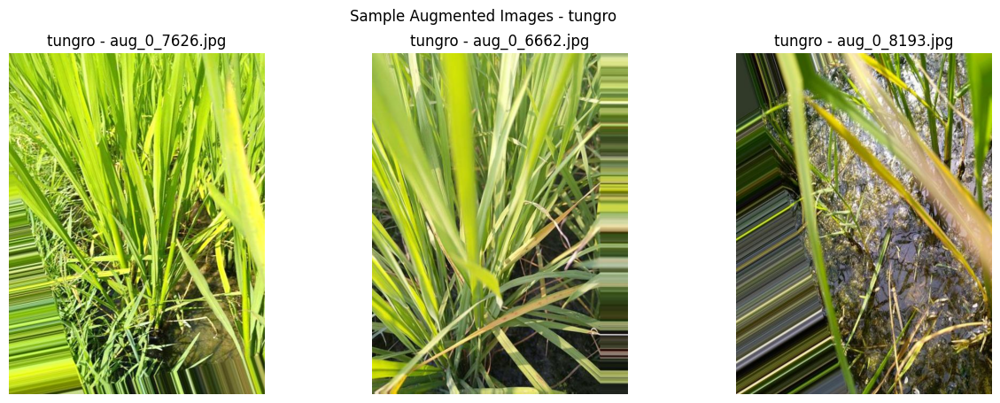

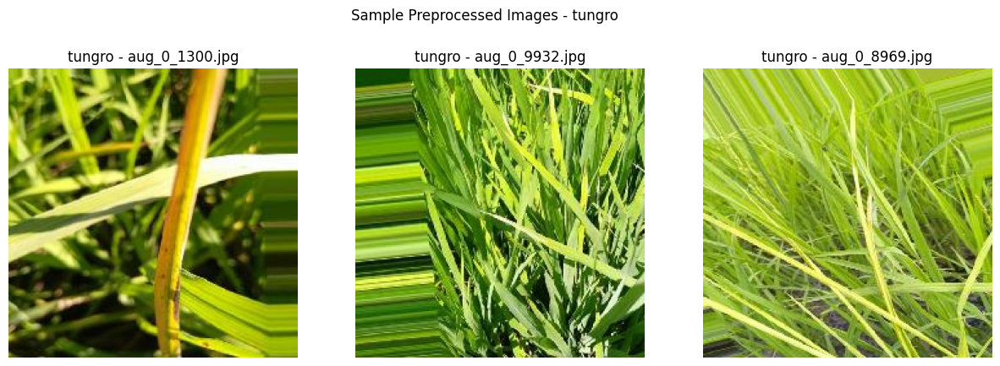

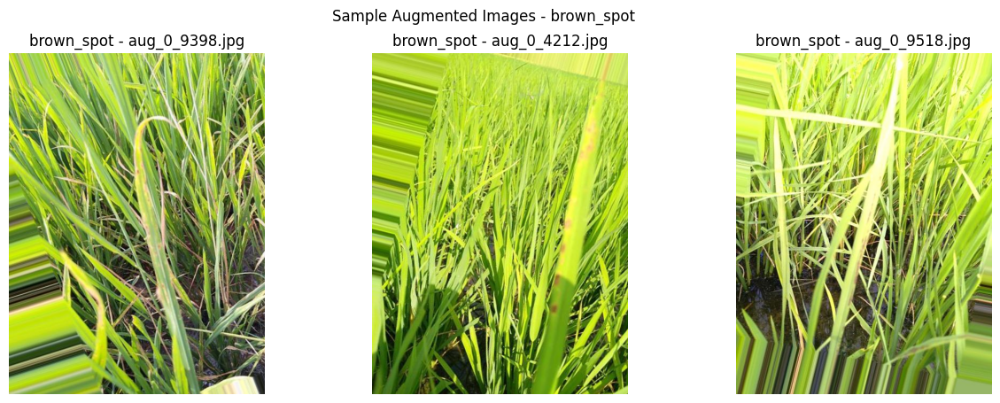

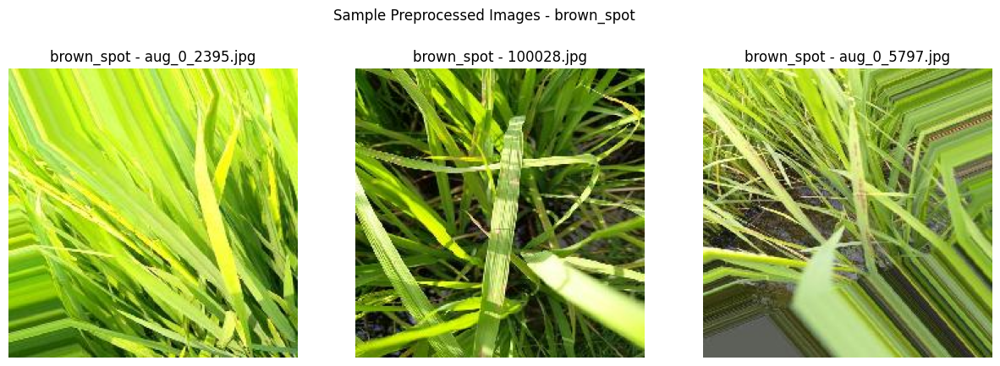

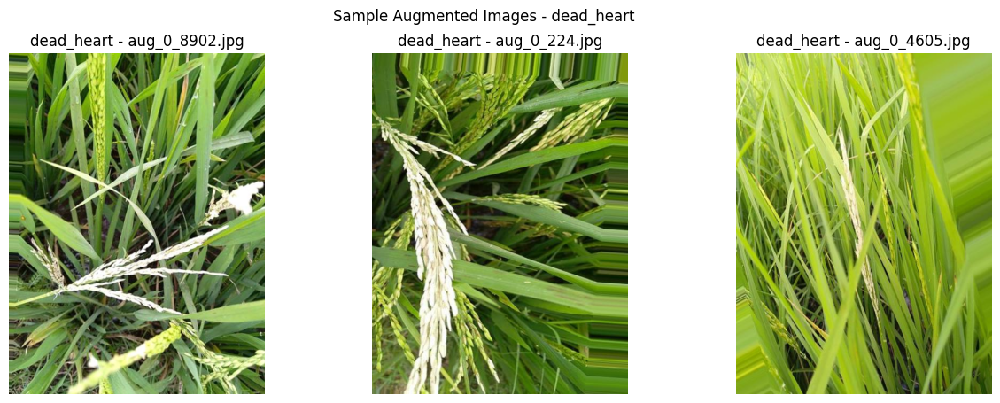

...

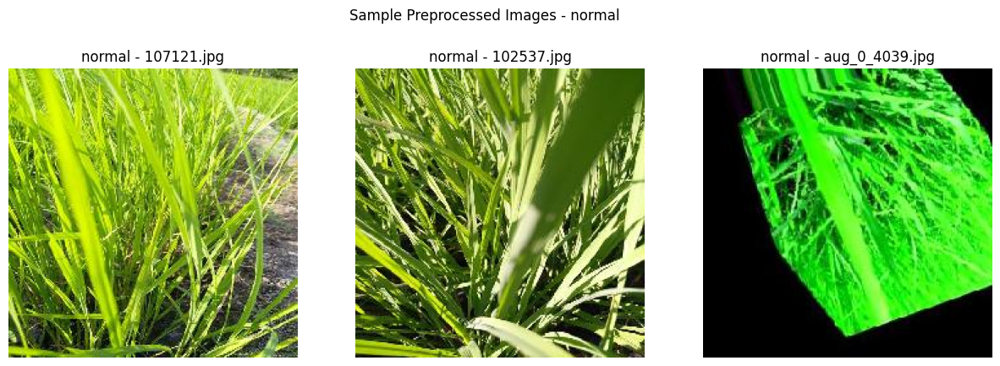

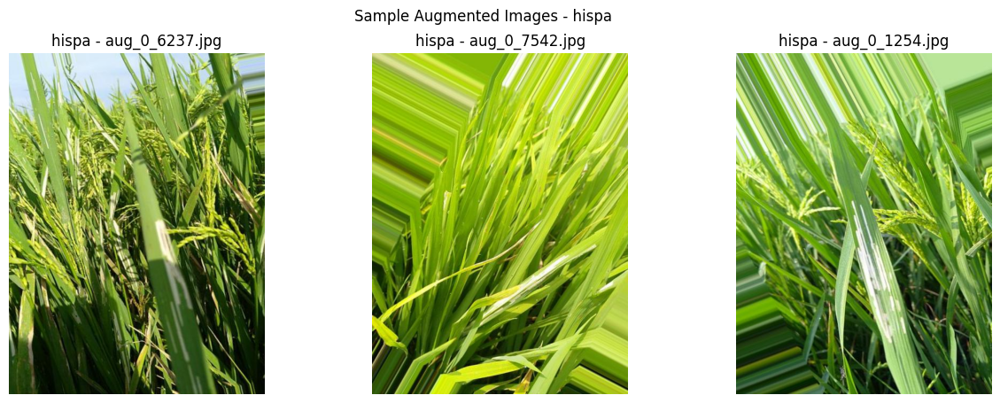

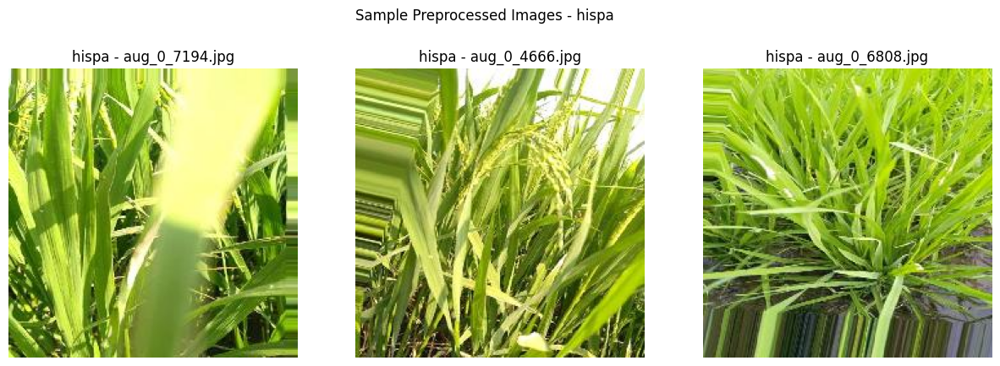

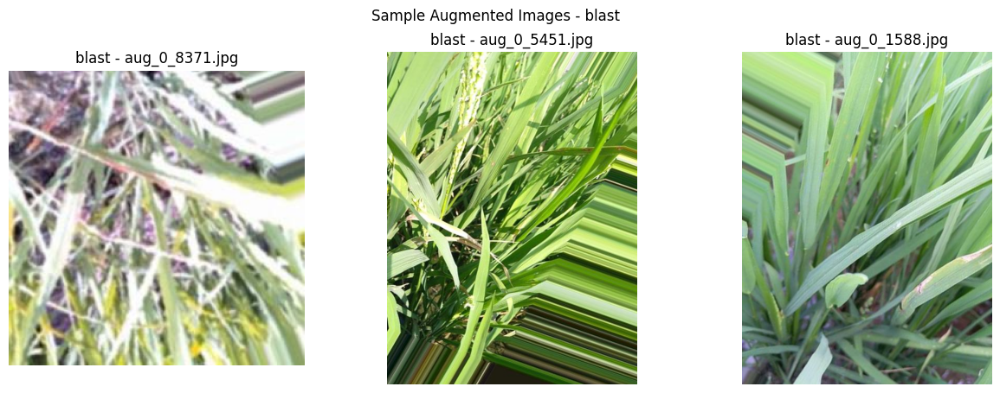

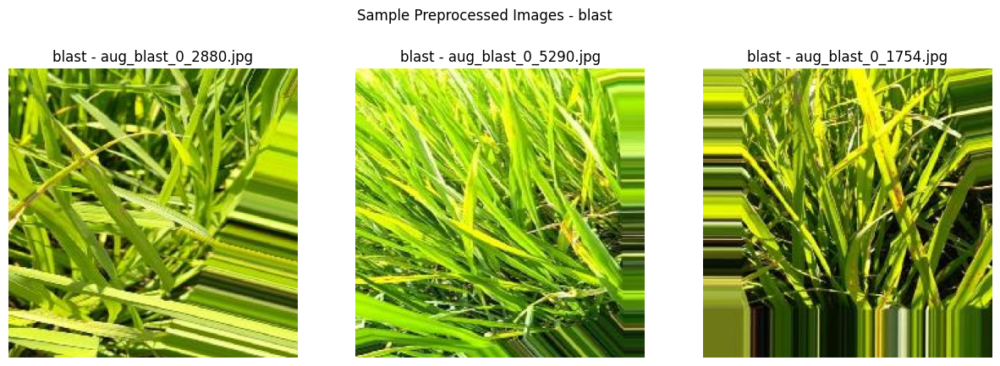

In [ ]:
import matplotlib.pyplot as plt
import os
import random
import cv2

# Define dataset paths
augmented_path = "/content/drive/MyDrive/Crop disease monitoring system/augmented_dataset_v2"
preprocessed_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

# List of classes
classes = ["tungro", "brown_spot", "dead_heart", "normal", "hispa", "blast"]

# Function to display images from a class
def display_images(dataset_path, class_name, title, num_images=3):
    class_folder = os.path.join(dataset_path, class_name)

    if not os.path.exists(class_folder) or len(os.listdir(class_folder)) == 0:
        print(f"❌ No images found in {class_folder}")
        return

    image_files = os.listdir(class_folder)
    sample_images = random.sample(image_files, min(num_images, len(image_files)))

    plt.figure(figsize=(15, 5))
    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(class_folder, img_name)
        img = cv2.imread(img_path)
        if img is None:
            continue  # Skip unreadable images
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{class_name} - {img_name}")

    plt.suptitle(title)
    plt.show()

# Loop through each class and display images
for class_name in classes:
    display_images(augmented_path, class_name, f"Sample Augmented Images - {class_name}")
    display_images(preprocessed_path, class_name, f"Sample Preprocessed Images - {class_name}")


In [ ]:
import os
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import (
    Input, Dense, LSTM, Dropout, Reshape, Concatenate, Layer, Lambda
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ✅ Set dataset paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# ✅ Load metadata
df_metadata = pd.read_csv(metadata_path)
print(f"✅ Loaded metadata with {len(df_metadata)} entries")

# ✅ Mapping labels to numerical values
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}
df_metadata["label"] = df_metadata["label"].map(label_mapping)

# ✅ Function to load image & metadata in batches (Returns TensorFlow Dataset)
def data_generator(df, batch_size=32):
    def generator():
        df_shuffled = df.sample(frac=1).reset_index(drop=True)  # ✅ Shuffle data
        for i in range(0, len(df_shuffled), batch_size):
            batch_df = df_shuffled.iloc[i:i+batch_size]

            images, metadata, labels = [], [], []
            for _, row in batch_df.iterrows():
                label_name = list(label_mapping.keys())[list(label_mapping.values()).index(row["label"])]
                img_path = os.path.join(image_dataset_path, label_name, row["image_id"])

                if os.path.exists(img_path):
                    img = load_img(img_path, target_size=(224, 224))  # ✅ Resize image
                    img_array = img_to_array(img) / 255.0  # ✅ Normalize
                    images.append(img_array)

                    metadata.append([row["age"]])  # ✅ Extract metadata
                    labels.append(row["label"])  # ✅ Class labels

            images = np.array(images, dtype=np.float32)
            metadata = np.array(metadata, dtype=np.float32)
            labels = to_categorical(labels, num_classes=6)  # ✅ One-hot encode labels

            yield (images, metadata), labels  # ✅ Return batch

    output_signature = (
        (tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 1), dtype=tf.float32)),
        tf.TensorSpec(shape=(None, 6), dtype=tf.float32)
    )

    return tf.data.Dataset.from_generator(generator, output_signature=output_signature)

# ✅ Split data (80% Train, 20% Validation)
train_df, val_df = train_test_split(df_metadata, test_size=0.2, random_state=42, stratify=df_metadata["label"])

# ✅ Normalize metadata
scaler = StandardScaler()
train_df["age"] = scaler.fit_transform(train_df[["age"]])
val_df["age"] = scaler.transform(val_df[["age"]])

# ✅ Load ViT Model (Feature Extractor)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define Model
def build_vit_rnn_metadata_model():
    # ✅ Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")

    # ✅ Wrap ViT in a Lambda layer
    vit_extractor = Lambda(lambda img: vit_model(img), name="vit_extractor")(image_input)

    x = Reshape((1, 768))(vit_extractor)  # ✅ Reshape for RNN input
    x = AttentionLayer()(x)  # ✅ Attention Mechanism
    x = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(x)
    x = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(x)

    # ✅ Metadata Input
    metadata_input = Input(shape=(1,), name="metadata_input")
    metadata_dense = Dense(32, activation="relu")(metadata_input)

    # ✅ Merge Features
    merged = Concatenate()([x, metadata_dense])
    merged = Dense(128, activation="relu")(merged)
    merged = Dropout(0.3)(merged)
    output_layer = Dense(6, activation="softmax")(merged)

    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Initialize Model
model = build_vit_rnn_metadata_model()
model.summary()

# ✅ Callbacks (Early Stopping & Checkpoint)
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint("/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
                             save_best_only=True, monitor="val_accuracy", mode="max")

# ✅ Training Parameters
batch_size = 32
train_steps = len(train_df) // batch_size
val_steps = len(val_df) // batch_size

# ✅ Train the Model using TensorFlow Dataset
history = model.fit(
    data_generator(train_df, batch_size=batch_size),  # ✅ Training Generator
    validation_data=data_generator(val_df, batch_size=batch_size),  # ✅ Validation Generator
    steps_per_epoch=train_steps,
    validation_steps=val_steps,
    epochs=30,
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)

# ✅ Save the final model
model.save("/content/drive/MyDrive/Crop disease monitoring system/final_model.keras")
print("✅ Model training complete & saved successfully!")


✅ Loaded metadata with 35779 entries


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vit_extractor (Lambda)    │ (None, 768)            │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 768)         │              0 │ vit_extractor[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer           │ (None, 1, 768)         │        590,592 │ reshape[0][0]          │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 128)         │        459,264 │ attention_layer[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 32)             │             64 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │         12,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6)              │            774 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,518 (4.24 MB)

 Trainable params: 1,112,518 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
  7/894 ━━━━━━━━━━━━━━━━━━━━ 6:01:02 24s/step - accuracy: 0.1736 - loss: 1.8017

In [ ]:
import os
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import (
    Input, Dense, LSTM, Dropout, Reshape, Concatenate, Layer
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.data import AUTOTUNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ✅ Set dataset paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# ✅ Load metadata
df_metadata = pd.read_csv(metadata_path)
print(f"✅ Loaded metadata with {len(df_metadata)} entries")

# ✅ Mapping labels to numerical values
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}
df_metadata["label"] = df_metadata["label"].map(label_mapping)

# ✅ Split metadata (80% Train, 20% Validation)
train_df, val_df = train_test_split(df_metadata, test_size=0.2, random_state=42, stratify=df_metadata["label"])

# ✅ Load Image Dataset (Automatically Handles Loading & Preprocessing)
batch_size = 32
train_data = tf.keras.utils.image_dataset_from_directory(
    image_dataset_path, batch_size=batch_size, image_size=(256, 256),
    label_mode="categorical", shuffle=True, seed=42
)
val_data = tf.keras.utils.image_dataset_from_directory(
    image_dataset_path, batch_size=batch_size, image_size=(256, 256),
    label_mode="categorical", shuffle=False, seed=42
)

# ✅ Load ViT Model (Feature Extractor) for 256x256 input
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom wrapper for ViT to handle 256x256 images
def vit_feature_extractor(inputs):
    resized = tf.image.resize(inputs, (224, 224))  # Resize to 224x224 (ViT input requirement)
    return vit_model(resized)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Build Model
def build_vit_rnn_metadata_model():
    # ✅ Image Input
    image_input = Input(shape=(256, 256, 3), name="image_input")  # <-- Changed to 256x256
    vit_features = Lambda(vit_feature_extractor)(image_input)  # ✅ Wrap ViT in Lambda
    x = Reshape((1, 768))(vit_features)  # ✅ Reshape for RNN input
    x = AttentionLayer()(x)  # ✅ Attention Mechanism


✅ Loaded metadata with 35779 entries
Found 35779 files belonging to 6 classes.
Found 35779 files belonging to 6 classes.


In [ ]:
import os

model_dir = "/content/drive/MyDrive/Crop disease monitoring system"
models = [f for f in os.listdir(model_dir) if f.endswith(".keras")]

print("📂 Available saved models:", models)


📂 Available saved models: ['final_gpu_model.keras', 'vit_rnn_attention_model.keras', 'temp_model.keras']


In [ ]:
for batch in train_data.take(1):
    print(f"Batch contents: {batch}")
    break  # Stop after the first batch


Batch contents: (<tf.Tensor: shape=(32, 256, 256, 3), dtype=float32, numpy=
array([[[[3.20000000e+01, 6.00000000e+01, 3.70000000e+01],
         [2.79375000e+01, 5.83750000e+01, 2.07500000e+01],
         [8.26875000e+01, 1.15750000e+02, 5.06875000e+01],
         ...,
         [2.15250000e+02, 2.36875000e+02, 1.80875000e+02],
         [1.96375000e+02, 2.19375000e+02, 1.63375000e+02],
         [1.98000000e+02, 2.21000000e+02, 1.65000000e+02]],

        [[3.68750000e+01, 6.24375000e+01, 4.02500000e+01],
         [3.08320312e+01, 5.88320312e+01, 2.33398438e+01],
         [3.42929688e+01, 6.54765625e+01, 1.45820312e+01],
         ...,
         [1.98289062e+02, 2.18593750e+02, 1.65031250e+02],
         [1.87285156e+02, 2.07847656e+02, 1.54285156e+02],
         [1.98812500e+02, 2.19375000e+02, 1.65812500e+02]],

        [[3.18125000e+01, 5.61250000e+01, 3.27500000e+01],
         [2.81054688e+01, 5.37382812e+01, 2.29492188e+01],
         [1.56484375e+01, 4.33906250e+01, 6.46484375e+00],
       

In [ ]:
def data_generator(df, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices((df["image_id"], df["age"], df["label"]))

    def load_data(image_id, age, label):
        # Load Image
        img_path = tf.strings.join([image_dataset_path, label, image_id], separator="/")
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, [256, 256]) / 255.0  # Normalize

        # Convert metadata (age) to float32
        age = tf.cast(age, tf.float32)

        # One-hot encode labels
        label = tf.one_hot(label, depth=6)

        return (img, age), label  # ✅ Return Image + Metadata + Label

    dataset = dataset.map(load_data, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset


In [ ]:
import os
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ✅ Set Dataset Paths
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"

# ✅ Load Metadata
df_metadata = pd.read_csv(metadata_path)
print(f"✅ Loaded metadata with {len(df_metadata)} entries")

# ✅ Label Mapping
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}
df_metadata["label"] = df_metadata["label"].map(label_mapping)

# ✅ Train-Test Split
train_df, val_df = train_test_split(df_metadata, test_size=0.2, random_state=42, stratify=df_metadata["label"])
print(f"✅ Training Samples: {len(train_df)}")
print(f"✅ Validation Samples: {len(val_df)}")


✅ Loaded metadata with 35779 entries
✅ Training Samples: 28623
✅ Validation Samples: 7156


In [ ]:
import tensorflow as tf
import gc

gc.collect()
tf.keras.backend.clear_session()
print("✅ Cleared memory!")


✅ Cleared memory!


In [ ]:
import pandas as pd


In [ ]:
# ✅ Reload the metadata
metadata_path = "/content/drive/MyDrive/Crop disease monitoring system/full_metadata_cleaned.csv"
df_metadata = pd.read_csv(metadata_path)

# ✅ Ensure labels are mapped correctly
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}
df_metadata["label"] = df_metadata["label"].map(label_mapping)

# ✅ Split Train & Validation Sets Again
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(df_metadata, test_size=0.2, random_state=42, stratify=df_metadata["label"])

print(f"✅ Training Samples: {len(train_df)}")
print(f"✅ Validation Samples: {len(val_df)}")


✅ Training Samples: 28623
✅ Validation Samples: 7156


In [ ]:
# ✅ Define Dataset Path
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"


In [ ]:
print("🔍 Checking metadata sample:")
print(df_metadata.head())  # Print first few rows
print("\n🔍 Column Data Types:")
print(df_metadata.dtypes)  # Print data types


🔍 Checking metadata sample:
     image_id  label  age
0  102401.jpg      0   74
1  102333.jpg      0   55
2  102214.jpg      0   78
3  102426.jpg      0   80
4  102449.jpg      0   53

🔍 Column Data Types:
image_id    object
label        int64
age          int64
dtype: object


In [ ]:
import tensorflow as tf

# ✅ Check if label conversion works
test_label = 3  # Change this to any index from 0 to 5
label_mapping = {
    "tungro": 0, "brown_spot": 1, "dead_heart": 2,
    "normal": 3, "hispa": 4, "blast": 5
}

label_str = tf.convert_to_tensor(list(label_mapping.keys()), dtype=tf.string)[test_label]
tf.print("✅ Converted Label:", label_str)  # Should print "normal" for test_label=3


✅ Converted Label: "normal"


In [ ]:
print(f"🔍 Dataset Path: {image_dataset_path}")


🔍 Dataset Path: /content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset


In [ ]:
import os
print("🔍 Dataset Path Exists:", os.path.exists("/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"))


🔍 Dataset Path Exists: True


In [ ]:
sample_row = train_df.iloc[0]  # Get the first row of the dataframe

image_id = str(sample_row["image_id"])  # Convert image_id to string
label = str(sample_row["label"])  # Convert label to string

img_path = f"/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/{label}/{image_id}"

print("🔍 Checking File:", img_path)
print("✅ File Exists:", os.path.exists(img_path))


🔍 Checking File: /content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset/0/aug_0_6551.jpg
✅ File Exists: False


In [ ]:
import os
base_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"
print("📂 Folders in Dataset:", os.listdir(base_path))  # Check if label folders exist


📂 Folders in Dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
import os

base_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

print("📂 Folders in Dataset:", os.listdir(base_path))  # List all subfolders


📂 Folders in Dataset: ['tungro', 'brown_spot', 'dead_heart', 'normal', 'hispa', 'blast']


In [ ]:
sample_label_folder = os.path.join(base_path, "normal")  # Change "normal" to another label if needed

if os.path.exists(sample_label_folder):
    print("📄 Sample Files:", os.listdir(sample_label_folder)[:10])  # Show first 10 files
else:
    print("❌ Folder Not Found:", sample_label_folder)


📄 Sample Files: ['105553.jpg', '105500.jpg', '105537.jpg', '105542.jpg', '105592.jpg', '105545.jpg', '105647.jpg', '105633.jpg', '105508.jpg', '105596.jpg']


In [ ]:
# Define the correct mapping from numerical labels to folder names
label_mapping = {
    0: "tungro",
    1: "brown_spot",
    2: "dead_heart",
    3: "normal",
    4: "hispa",
    5: "blast"
}


In [ ]:
import tensorflow as tf

# ✅ Define label mapping
label_mapping = {
    0: "tungro",
    1: "brown_spot",
    2: "dead_heart",
    3: "normal",
    4: "hispa",
    5: "blast"
}

# ✅ Dataset Path
image_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/preprocessed_dataset"

def get_folder_name(label):
    """Convert integer label to folder name using Python dictionary (outside TensorFlow graph)."""
    return label_mapping[int(label.numpy())]  # ✅ Convert tensor to int, get folder name

def load_process(image_id, label, age):
    """Load image & metadata for training."""
    # ✅ Convert label using tf.py_function (Ensures it's handled outside TensorFlow graph)
    folder_name = tf.py_function(func=get_folder_name, inp=[label], Tout=tf.string)

    # ✅ Construct image path
    img_path = tf.strings.join([image_dataset_path, folder_name, image_id], separator="/")

    # ✅ Load and preprocess image
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224)) / 255.0  # Normalize

    return (img, tf.cast(age, tf.float32)), tf.one_hot(label, depth=6)

def data_generator(df, batch_size=32):
    """Generate dataset for training using TensorFlow Dataset API."""
    dataset = tf.data.Dataset.from_tensor_slices((
        df["image_id"].values,
        df["label"].values,
        df["age"].values
    ))

    dataset = dataset.map(load_process).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


In [ ]:
sample_data = data_generator(train_df.sample(5), batch_size=1)

for batch in sample_data.take(5):  # Load 5 batches
    (img_sample, metadata_sample), label_sample = batch
    print(f"📸 Image Sample Shape: {img_sample.shape}")
    print(f"📝 Metadata Sample Shape: {metadata_sample.shape}")
    print(f"🏷️ Label Sample Shape: {label_sample.shape}")


📸 Image Sample Shape: (1, 224, 224, 3)
📝 Metadata Sample Shape: (1,)
🏷️ Label Sample Shape: (1, 6)
📸 Image Sample Shape: (1, 224, 224, 3)
📝 Metadata Sample Shape: (1,)
🏷️ Label Sample Shape: (1, 6)
📸 Image Sample Shape: (1, 224, 224, 3)
📝 Metadata Sample Shape: (1,)
🏷️ Label Sample Shape: (1, 6)
📸 Image Sample Shape: (1, 224, 224, 3)
📝 Metadata Sample Shape: (1,)
🏷️ Label Sample Shape: (1, 6)
📸 Image Sample Shape: (1, 224, 224, 3)
📝 Metadata Sample Shape: (1,)
🏷️ Label Sample Shape: (1, 6)


In [ ]:
train_data = data_generator(train_df, batch_size=32)
val_data = data_generator(val_df, batch_size=32)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ✅ Early Stopping (Stop training if val_loss doesn't improve for 5 epochs)
early_stopping = EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True, verbose=1
)

# ✅ Model Checkpoint (Save the best model based on validation accuracy)
checkpoint = ModelCheckpoint(
    "/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
    save_best_only=True, monitor="val_accuracy", mode="max", verbose=1
)

# ✅ Train the Model with All Required Attributes
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=30,  # You can increase if needed
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)


Epoch 1/30
895/895 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.4386 - loss: 1.5665

KeyboardInterrupt: 

In [ ]:
model.save("/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras")
print("✅ Model progress saved successfully!")


✅ Model progress saved successfully!


In [ ]:
print(history.history if 'history' in locals() else "❌ No training history found.")


❌ No training history found.


In [ ]:
import keras.saving
import tensorflow as tf

@keras.saving.register_keras_serializable()
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)  # ✅ Allow extra arguments like 'trainable'

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]),
                                 initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

    def get_config(self):  # ✅ Add this for proper deserialization
        config = super().get_config()
        return config


In [ ]:
from tensorflow.keras.models import load_model

model = load_model(
    "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras",
    custom_objects={"AttentionLayer": AttentionLayer},  # ✅ Register custom layer
    safe_mode=False
)

print("✅ Model reloaded successfully!")


✅ Model reloaded successfully!


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ✅ Early Stopping (Stop training if val_loss doesn't improve for 5 epochs)
early_stopping = EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True, verbose=1
)

# ✅ Model Checkpoint (Save the best model based on validation accuracy)
checkpoint = ModelCheckpoint(
    "/content/drive/MyDrive/Crop disease monitoring system/best_model.keras",
    save_best_only=True, monitor="val_accuracy", mode="max", verbose=1
)

# ✅ Train the Model with All Required Attributes
history = model.fit(
    train_data,
    validation_data=val_data,
    initial_epoch=1,
    epochs=30,  # You can increase if needed
    verbose=1,
    callbacks=[early_stopping, checkpoint]
)


Epoch 2/30


KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

# ✅ Reload the model
model_path = "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras"
model = load_model(model_path, custom_objects={"AttentionLayer": AttentionLayer}, safe_mode=False)

print("✅ Model reloaded successfully!")


✅ Model reloaded successfully!


In [ ]:
model.save("/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras")
print("✅ Model progress saved successfully!")


✅ Model progress saved successfully!


In [ ]:
import pickle
history_path = "/content/drive/MyDrive/Crop disease monitoring system/training_history.pkl"

if "history" in locals():  # Check if history exists
    with open(history_path, "wb") as f:
        pickle.dump(history.history, f)
    print("✅ Training history saved!")
else:
    print("❌ No training history found.")


❌ No training history found.


In [ ]:
import os

model_path = "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras"
history_path = "/content/drive/MyDrive/Crop disease monitoring system/training_history.pkl"

print("✅ Model Exists:", os.path.exists(model_path))
print("✅ Training History Exists:", os.path.exists(history_path))


✅ Model Exists: True
✅ Training History Exists: True


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

# ✅ Reload the model
model = load_model(model_path, custom_objects={"AttentionLayer": AttentionLayer}, safe_mode=False)

print("✅ Model reloaded successfully!")


✅ Model reloaded successfully!


In [ ]:
import os

history_path = "/content/drive/MyDrive/Crop disease monitoring system/training_history.pkl"

if os.path.exists(history_path):
    file_size = os.path.getsize(history_path)
    print(f"📂 Training history file size: {file_size} bytes")
    if file_size == 0:
        print("⚠️ Training history file is empty! It may have been saved incorrectly.")
else:
    print("❌ Training history file not found!")


📂 Training history file size: 0 bytes
⚠️ Training history file is empty! It may have been saved incorrectly.


In [ ]:
import tensorflow as tf
import keras.saving

@keras.saving.register_keras_serializable()
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(
            shape=(input_shape[-1], input_shape[-1]),
            initializer="random_normal",
            trainable=True
        )
        self.b = self.add_weight(
            shape=(input_shape[-1],),
            initializer="zeros",
            trainable=True
        )

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights


In [ ]:
import os

model_path = "/content/drive/MyDrive/Crop disease monitoring system/best_model.keras"
print("🔍 Model Exists:", os.path.exists(model_path))


🔍 Model Exists: False


In [ ]:
import os

model_dir = "/content/drive/MyDrive/Crop disease monitoring system"
files = os.listdir(model_dir)

print("📂 Available Files:", files)


📂 Available Files: ['train_images', 'filtered_dataset', 'augmented_dataset_v2', 'merged_dataset', 'Copy of Working_system.ipynb', 'Working_system.ipynb', 'preprocessed_dataset', 'augmented_blast', 'final_gpu_model.keras', 'vit_rnn_attention_model.keras', 'vit_rnn_attention_model.h5', 'train.csv', 'processed_metadata.csv', 'filtered_metadata.csv', 'simple_metadata.csv', 'full_metadata_cleaned.csv', 'full_metadata.csv', 'training_history.pkl', 'temp_model.keras']


In [ ]:
import tensorflow as tf

model_path = "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras"

if os.path.exists(model_path):
    print("✅ Found temp_model.keras! Loading...")
    model = tf.keras.models.load_model(model_path, custom_objects={"AttentionLayer": AttentionLayer}, safe_mode=False)
    print("✅ Model reloaded successfully!")
else:
    print("❌ temp_model.keras not found!")


✅ Found temp_model.keras! Loading...
✅ Model reloaded successfully!


In [ ]:
import tensorflow_hub as hub

# ✅ Re-define Vision Transformer (ViT) Model
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Reload the Saved Model After Defining vit_model
model = tf.keras.models.load_model(
    "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras",
    custom_objects={"AttentionLayer": AttentionLayer, "KerasLayer": hub.KerasLayer},
    safe_mode=False
)

print("✅ Model reloaded successfully!")


✅ Model reloaded successfully!


In [ ]:
import tensorflow_hub as hub

# ✅ Re-define Vision Transformer (ViT) Model
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)
print("✅ ViT Model redefined successfully!")


✅ ViT Model redefined successfully!


In [ ]:
model = tf.keras.models.load_model(
    "/content/drive/MyDrive/Crop disease monitoring system/temp_model.keras",
    custom_objects={"AttentionLayer": AttentionLayer, "KerasLayer": hub.KerasLayer},
    safe_mode=False
)
print("✅ Model reloaded successfully!")


✅ Model reloaded successfully!


In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.layers import (Input, Dense, LSTM, Dropout, Reshape, Lambda,
                                     Layer, GlobalAveragePooling1D, Concatenate)
from tensorflow.keras.models import Model

# ✅ Load TensorFlow-Compatible Vision Transformer (ViT)
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False, name="ViT")

# ✅ Preprocess Images for ViT (Normalize to [-1,1])
def preprocess_vit(x):
    return (x - 0.5) * 2  # Scale from [0,1] to [-1,1] as required by ViT

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]),
                                 initializer="random_normal", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ Define ViT Feature Extractor (Pass vit_model as argument)
def vit_feature_extractor(inputs, vit_model=vit_model):  # Pass vit_model
    return vit_model(inputs)

# ✅ Define the Multi-Input Model (Images + Metadata)
def build_vit_rnn_metadata_model():
    # ✅ Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")

    # ✅ Preprocess Images Before ViT
    preprocessed_input = Lambda(preprocess_vit, name="preprocess_vit")(image_input)

    # ✅ Call Lambda with vit_model as an argument
    vit_features = Lambda(lambda x: vit_feature_extractor(x, vit_model=vit_model))(preprocessed_input)
    vit_features = Reshape((1, 768))(vit_features)  # Reshape for LSTM
    vit_features = AttentionLayer()(vit_features)

    # ✅ RNN (LSTM)
    rnn_features = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(vit_features)
    rnn_features = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(rnn_features)

    # ✅ Metadata Input
    metadata_input = Input(shape=(1,), name="metadata_input")  # Updated for 1 metadata feature
    metadata_features = Dense(32, activation="relu")(metadata_input)

    # ✅ Concatenate Image + Metadata Features
    combined = Concatenate()([rnn_features, metadata_features])

    # ✅ Fully Connected Layers
    x = Dense(128, activation="relu")(combined)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    # ✅ Define Model
    model = Model(inputs=[image_input, metadata_input], outputs=output_layer)

    # ✅ Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# ✅ Build the Updated Model
model = build_vit_rnn_metadata_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ preprocess_vit (Lambda)   │ (None, 224, 224, 3)    │              0 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 768)            │              0 │ preprocess_vit[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 768)         │              0 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_3         │ (None, 1, 768)         │        590,592 │ reshape[0][0]          │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 128)         │        459,264 │ attention_layer_3[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ metadata_input            │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 32)             │             64 │ metadata_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │         12,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6)              │            774 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,112,518 (4.24 MB)

 Trainable params: 1,112,518 (4.24 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
import os

base_path = "/content/drive/MyDrive/Crop disease monitoring system"
print("📂 Subdirectories:")
print(os.listdir(base_path))


📂 Subdirectories:
['train_images', 'filtered_dataset', 'augmented_dataset_v2', 'merged_dataset', 'Copy of Working_system.ipynb', 'Working_system.ipynb', 'preprocessed_dataset', 'augmented_blast', 'final_gpu_model.keras', 'vit_rnn_attention_model.keras', 'vit_rnn_attention_model.h5', 'train.csv', 'processed_metadata.csv', 'filtered_metadata.csv', 'simple_metadata.csv', 'full_metadata_cleaned.csv', 'full_metadata.csv', 'temp_model.keras', 'training_history.pkl', 'reduced_dataset']


In [4]:
image_path = "/content/drive/MyDrive/Crop disease monitoring system/train_images"
print("📂 Disease subdirectories:")
print(os.listdir(image_path))


📂 Disease subdirectories:
['blast', 'brown_spot', 'dead_heart', 'hispa', 'normal', 'tungro']


In [1]:
import os
import shutil
import random

# Define paths
base_path = "/content/drive/MyDrive/Crop disease monitoring system/train_images"
reduced_path = "/content/drive/MyDrive/Crop disease monitoring system/reduced_dataset"

# Create the reduced dataset directory
os.makedirs(reduced_path, exist_ok=True)

# Disease categories
disease_names = ["tungro", "brown_spot", "dead_heart", "normal", "hispa", "blast"]
total_images = 10000  # Total number of images across all diseases

all_images = []

# Collect all images from each disease category
for disease in disease_names:
    disease_path = os.path.join(base_path, disease)
    images = os.listdir(disease_path)
    all_images.extend([(os.path.join(disease_path, img), disease) for img in images])

# Shuffle all images and select 10,000
random.shuffle(all_images)
selected_images = all_images[:total_images]

# Copy the selected images to the reduced dataset directory
for src, disease in selected_images:
    reduced_disease_path = os.path.join(reduced_path, disease)
    os.makedirs(reduced_disease_path, exist_ok=True)
    dst = os.path.join(reduced_disease_path, os.path.basename(src))
    shutil.copy(src, dst)

print("✅ Reduced dataset with a total of 10,000 images created successfully!")


✅ Reduced dataset with a total of 10,000 images created successfully!


In [5]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Lambda, Layer, Concatenate
from tensorflow.keras.models import Model

# ✅ Load ViT model from TensorFlow Hub
vit_model_url = 'https://tfhub.dev/sayakpaul/vit_b16_fe/1'
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# ✅ Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer='random_normal', trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer='zeros', trainable=True)

    def call(self, inputs):
        score = tf.nn.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        return inputs * attention_weights

# ✅ ViT Feature Extractor
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# ✅ Build the simplified ViT + RNN model (no metadata)
def build_vit_rnn_model():
    # Image Input
    image_input = Input(shape=(224, 224, 3), name='image_input')

    # ViT Feature Extraction
    vit_features = Lambda(lambda x: vit_feature_extractor(x))(image_input)
    vit_features = Reshape((1, 768))(vit_features)  # Reshape for LSTM
    vit_features = AttentionLayer()(vit_features)

    # RNN (LSTM)
    rnn_features = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(vit_features)
    rnn_features = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(rnn_features)

    # Fully Connected Layers
    x = Dense(128, activation='relu')(rnn_features)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation='softmax')(x)  # 6 classes

    # Model Definition
    model = Model(inputs=image_input, outputs=output_layer)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [7]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Reshape, Lambda, Concatenate
from tensorflow.keras.models import Model

# Load Vision Transformer (ViT) model from TensorFlow Hub
vit_model_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_model = hub.KerasLayer(vit_model_url, trainable=False)

# Define ViT Feature Extractor
def vit_feature_extractor(inputs):
    return vit_model(inputs)

# Build the ViT + RNN Model without Metadata
def build_vit_rnn_model():
    # Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")
    vit_features = Lambda(lambda x: vit_feature_extractor(x))(image_input)
    vit_features = Reshape((1, 768))(vit_features)  # Reshape for LSTM

    # RNN (LSTM)
    rnn_features = LSTM(128, return_sequences=True, dropout=0.3, recurrent_dropout=0.3)(vit_features)
    rnn_features = LSTM(64, dropout=0.3, recurrent_dropout=0.3)(rnn_features)

    # Fully Connected Layers
    x = Dense(128, activation="relu")(rnn_features)
    x = Dropout(0.3)(x)
    output_layer = Dense(6, activation="softmax")(x)  # 6 classes

    # Define Model
    model = Model(inputs=image_input, outputs=output_layer)

    # Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# Create and summarize the model
model = build_vit_rnn_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 1, 768)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 1, 128)              │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 517,766 (1.98 MB)

 Trainable params: 517,766 (1.98 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
import os

# Paths
reduced_path = "/content/drive/MyDrive/Crop disease monitoring system/reduced_dataset"
batch_size = 32
img_size = (224, 224)

# Split the dataset into train, validation, and test sets (70-20-10 split)
def create_dataset(subset, validation_split=0.2, seed=42):
    return tf.keras.preprocessing.image_dataset_from_directory(
        reduced_path,
        validation_split=validation_split,
        subset=subset,
        seed=seed,
        image_size=img_size,
        batch_size=batch_size
    )

# Train and validation datasets (split using validation_split)
train_ds = create_dataset("training", validation_split=0.3)  # 70% for training
val_ds = create_dataset("validation", validation_split=0.3)   # 20% for validation

# Test dataset (load separately to ensure no overlap)
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    reduced_path,
    seed=42,
    image_size=img_size,
    batch_size=batch_size,
    shuffle=True
)

# Check the datasets
print(f"Train batches: {tf.data.experimental.cardinality(train_ds)}")
print(f"Validation batches: {tf.data.experimental.cardinality(val_ds)}")
print(f"Test batches: {tf.data.experimental.cardinality(test_ds)}")


Found 9491 files belonging to 6 classes.
Using 6644 files for training.
Found 9491 files belonging to 6 classes.
Using 2847 files for validation.
Found 9491 files belonging to 6 classes.
Train batches: 208
Validation batches: 89
Test batches: 297


In [9]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
reduced_dataset_path = "/content/drive/MyDrive/Crop disease monitoring system/reduced_dataset"

# ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rescale=1.0/255.0,        # Normalize pixel values
    validation_split=0.3      # 70% training, 30% validation
)

# Training Dataset
train_dataset = datagen.flow_from_directory(
    reduced_dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="training"
)

# Validation Dataset
val_dataset = datagen.flow_from_directory(
    reduced_dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)

print(f"Train batches: {len(train_dataset)}")
print(f"Validation batches: {len(val_dataset)}")


Found 6646 images belonging to 6 classes.
Found 2845 images belonging to 6 classes.
Train batches: 208
Validation batches: 89


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import pickle

# Define callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    filepath="/content/drive/MyDrive/Crop disease monitoring system/best_reduced_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    mode="max",
    verbose=1
)

lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Train the model with callbacks
epochs = 30  # Adjust as needed
batch_size = 32

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=epochs,
    batch_size=batch_size,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint, lr_scheduler]
)

# Save the final trained model
model.save("/content/drive/MyDrive/Crop disease monitoring system/reduced_model.keras")
print("✅ Final model saved successfully!")

# Save the training history
with open("/content/drive/MyDrive/Crop disease monitoring system/reduced_training_history.pkl", "wb") as f:
    pickle.dump(history.history, f)
print("✅ Training history saved!")


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.4069 - loss: 1.5204 

In [5]:
import tensorflow as tf

# Check GPU availability
if tf.config.list_physical_devices('GPU'):
    print("✅ GPU is available. Using GPU for training.")
else:
    print("❌ No GPU found. Training will be done on CPU.")

# Set GPU memory growth to prevent memory issues
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)


✅ GPU is available. Using GPU for training.


In [11]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Checkpoint to save the best model
checkpoint_callback = ModelCheckpoint(
    "/content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5",
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)

# Early stopping to prevent overfitting
early_stopping_callback = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True,
    verbose=1
)

print("✅ Callbacks defined successfully!")


✅ Callbacks defined successfully!


In [12]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=30,
    batch_size=32,
    verbose=1,
    callbacks=[checkpoint_callback, early_stopping_callback]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.4229 - loss: 1.5006
Epoch 1: val_loss improved from inf to 0.83148, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 253s 1s/step - accuracy: 0.4235 - loss: 1.4993 - val_accuracy: 0.6942 - val_loss: 0.8315
Epoch 2/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - accuracy: 0.6825 - loss: 0.8596
Epoch 2: val_loss improved from 0.83148 to 0.56174, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 147s 601ms/step - accuracy: 0.6826 - loss: 0.8594 - val_accuracy: 0.8049 - val_loss: 0.5617
Epoch 3/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.7643 - loss: 0.6805
Epoch 3: val_loss improved from 0.56174 to 0.46633, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 121s 581ms/step - accuracy: 0.7644 - loss: 0.6804 - val_accuracy: 0.8425 - val_loss: 0.4663
Epoch 4/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.7890 - loss: 0.5888
Epoch 4: val_loss improved from 0.46633 to 0.40661, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 133s 537ms/step - accuracy: 0.7890 - loss: 0.5887 - val_accuracy: 0.8689 - val_loss: 0.4066
Epoch 5/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8230 - loss: 0.5144
Epoch 5: val_loss improved from 0.40661 to 0.38687, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 536ms/step - accuracy: 0.8230 - loss: 0.5144 - val_accuracy: 0.8724 - val_loss: 0.3869
Epoch 6/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8410 - loss: 0.4683
Epoch 6: val_loss improved from 0.38687 to 0.37471, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 537ms/step - accuracy: 0.8410 - loss: 0.4682 - val_accuracy: 0.8759 - val_loss: 0.3747
Epoch 7/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8544 - loss: 0.4176
Epoch 7: val_loss improved from 0.37471 to 0.29879, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 536ms/step - accuracy: 0.8544 - loss: 0.4176 - val_accuracy: 0.9030 - val_loss: 0.2988
Epoch 8/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8781 - loss: 0.3577
Epoch 8: val_loss did not improve from 0.29879
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 534ms/step - accuracy: 0.8780 - loss: 0.3578 - val_accuracy: 0.9033 - val_loss: 0.3055
Epoch 9/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8827 - loss: 0.3487
Epoch 9: val_loss did not improve from 0.29879
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 533ms/step - accuracy: 0.8826 - loss: 0.3488 - val_accuracy: 0.8921 - val_loss: 0.3120
Epoch 10/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.8832 - loss: 0.3382
Epoch 10: val_loss improved from 0.29879 to 0.28902, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 535ms/step - accuracy: 0.8832 - loss: 0.3382 - val_accuracy: 0.9100 - val_loss: 0.2890
Epoch 11/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.8898 - loss: 0.3127
Epoch 11: val_loss improved from 0.28902 to 0.25412, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 536ms/step - accuracy: 0.8898 - loss: 0.3127 - val_accuracy: 0.9163 - val_loss: 0.2541
Epoch 12/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.8926 - loss: 0.3015
Epoch 12: val_loss did not improve from 0.25412
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 534ms/step - accuracy: 0.8926 - loss: 0.3014 - val_accuracy: 0.9237 - val_loss: 0.2541
Epoch 13/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9101 - loss: 0.2664
Epoch 13: val_loss improved from 0.25412 to 0.24847, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 143s 537ms/step - accuracy: 0.9101 - loss: 0.2664 - val_accuracy: 0.9234 - val_loss: 0.2485
Epoch 14/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.9129 - loss: 0.2535
Epoch 14: val_loss improved from 0.24847 to 0.22580, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 536ms/step - accuracy: 0.9129 - loss: 0.2536 - val_accuracy: 0.9258 - val_loss: 0.2258
Epoch 15/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.9159 - loss: 0.2508
Epoch 15: val_loss did not improve from 0.22580
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 532ms/step - accuracy: 0.9159 - loss: 0.2508 - val_accuracy: 0.9290 - val_loss: 0.2387
Epoch 16/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.9182 - loss: 0.2334
Epoch 16: val_loss improved from 0.22580 to 0.22562, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 535ms/step - accuracy: 0.9182 - loss: 0.2333 - val_accuracy: 0.9339 - val_loss: 0.2256
Epoch 17/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.9272 - loss: 0.2180
Epoch 17: val_loss improved from 0.22562 to 0.21155, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 142s 537ms/step - accuracy: 0.9272 - loss: 0.2180 - val_accuracy: 0.9346 - val_loss: 0.2115
Epoch 18/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9264 - loss: 0.2239
Epoch 18: val_loss improved from 0.21155 to 0.20793, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 537ms/step - accuracy: 0.9263 - loss: 0.2238 - val_accuracy: 0.9343 - val_loss: 0.2079
Epoch 19/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9305 - loss: 0.1980
Epoch 19: val_loss improved from 0.20793 to 0.20505, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 142s 537ms/step - accuracy: 0.9305 - loss: 0.1980 - val_accuracy: 0.9402 - val_loss: 0.2050
Epoch 20/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.9327 - loss: 0.1879
Epoch 20: val_loss did not improve from 0.20505
208/208 ━━━━━━━━━━━━━━━━━━━━ 141s 534ms/step - accuracy: 0.9327 - loss: 0.1879 - val_accuracy: 0.9388 - val_loss: 0.2145
Epoch 21/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9401 - loss: 0.1791
Epoch 21: val_loss improved from 0.20505 to 0.19555, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 142s 537ms/step - accuracy: 0.9402 - loss: 0.1791 - val_accuracy: 0.9399 - val_loss: 0.1956
Epoch 22/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.9364 - loss: 0.1809
Epoch 22: val_loss did not improve from 0.19555
208/208 ━━━━━━━━━━━━━━━━━━━━ 120s 576ms/step - accuracy: 0.9364 - loss: 0.1810 - val_accuracy: 0.9374 - val_loss: 0.1985
Epoch 23/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9486 - loss: 0.1503
Epoch 23: val_loss improved from 0.19555 to 0.19262, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 121s 580ms/step - accuracy: 0.9486 - loss: 0.1503 - val_accuracy: 0.9424 - val_loss: 0.1926
Epoch 24/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9561 - loss: 0.1368
Epoch 24: val_loss improved from 0.19262 to 0.18315, saving model to /content/drive/MyDrive/Crop disease monitoring system/vit_rnn_best_model.h5


208/208 ━━━━━━━━━━━━━━━━━━━━ 112s 537ms/step - accuracy: 0.9561 - loss: 0.1368 - val_accuracy: 0.9427 - val_loss: 0.1831
Epoch 25/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.9516 - loss: 0.1332
Epoch 25: val_loss did not improve from 0.18315
208/208 ━━━━━━━━━━━━━━━━━━━━ 120s 576ms/step - accuracy: 0.9516 - loss: 0.1332 - val_accuracy: 0.9431 - val_loss: 0.2104
Epoch 26/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9412 - loss: 0.1549
Epoch 26: val_loss did not improve from 0.18315
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 534ms/step - accuracy: 0.9413 - loss: 0.1549 - val_accuracy: 0.9431 - val_loss: 0.2026
Epoch 27/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.9609 - loss: 0.1217
Epoch 27: val_loss did not improve from 0.18315
208/208 ━━━━━━━━━━━━━━━━━━━━ 111s 532ms/step - accuracy: 0.9608 - loss: 0.1218 - val_accuracy: 0.9469 - val_loss: 0.1920
Epoch 28/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.9539 - loss: 0.1232
Epoch 28: val_lo

In [13]:
model.save('model_name.keras')


In [14]:
!ls -lh


total 6.0M
drwx------ 7 root root 4.0K Mar 30 20:04 drive
-rw-r--r-- 1 root root 6.0M Mar 30 22:18 model_name.keras
drwxr-xr-x 1 root root 4.0K Mar 24 13:34 sample_data


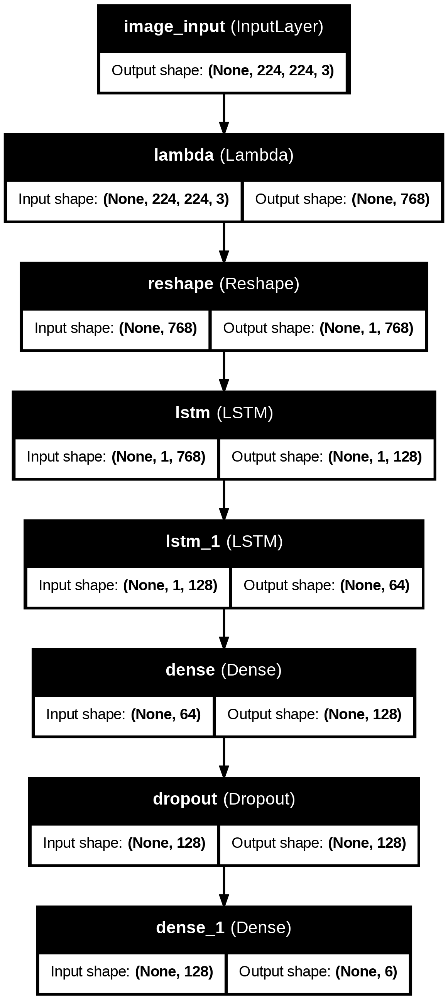

In [18]:
from tensorflow.keras.utils import plot_model

# Visualize the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


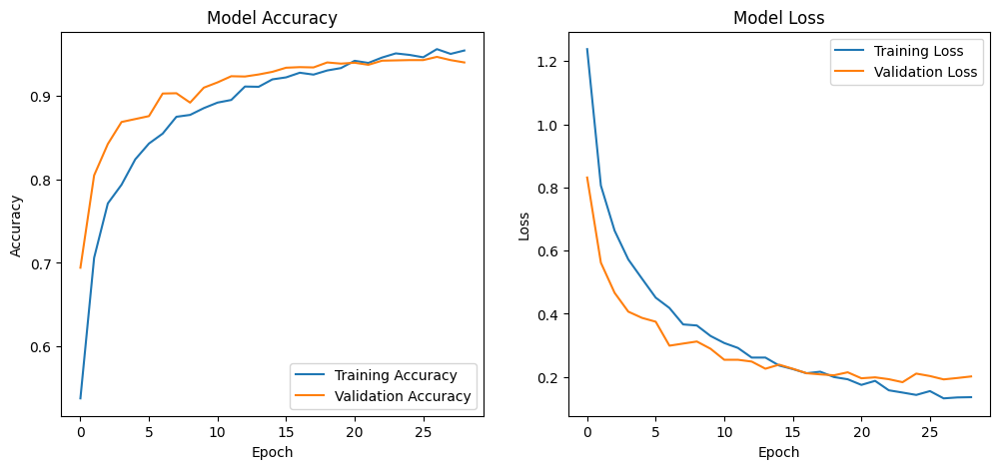

In [19]:
import matplotlib.pyplot as plt

# Plotting accuracy
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [22]:
import zipfile

# Path to your zipped test data
zip_path = '/content/drive/My Drive/Crop disease monitoring system/test_images.zip'
unzip_path = '/content/test_images'  # Destination folder

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(unzip_path)

print("Test data unzipped successfully!")


Test data unzipped successfully!


In [23]:
import tensorflow as tf

# Load test dataset
test_data = tf.keras.preprocessing.image_dataset_from_directory(
    unzip_path,
    image_size=(256, 256),  # Same size used during training
    batch_size=32,          # Adjust based on your system capacity
    label_mode='int',       # If labels are integers (0 to 5 for each class)
    shuffle=False          # Do not shuffle to keep order intact
)

# Verify the loaded data
for images, labels in test_data.take(1):
    print("Batch of images shape:", images.shape)
    print("Batch of labels shape:", labels.shape)


Found 3469 files belonging to 1 classes.
Batch of images shape: (32, 256, 256, 3)
Batch of labels shape: (32,)


In [24]:
import os
import shutil

# Path to the extracted test images folder
src_path = '/content/drive/MyDrive/Crop disease monitoring system/test_images'  # Adjust if necessary

# Target structure for organized data
classes = ['Tungro', 'Brown_Spot', 'Dead_Heart', 'Normal', 'Hispa', 'Blast']

# Create subfolders if not exist
for class_name in classes:
    class_dir = os.path.join(src_path, class_name)
    os.makedirs(class_dir, exist_ok=True)

# Move files to the correct folders
for filename in os.listdir(src_path):
    file_path = os.path.join(src_path, filename)
    if os.path.isfile(file_path):
        for class_name in classes:
            if class_name.lower() in filename.lower():
                dest_path = os.path.join(src_path, class_name, filename)
                shutil.move(file_path, dest_path)
                print(f'Moved: {filename} -> {class_name} folder')
                break

print("Test images organized successfully!")


Test images organized successfully!


In [27]:
test_data_path = "/content/test_images"


In [28]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Load the test dataset
test_dataset = image_dataset_from_directory(
    test_data_path,
    image_size=(256, 256),  # Same size as training data
    batch_size=32,
    label_mode="categorical"
)

print("Test dataset loaded successfully!")


Found 3469 files belonging to 1 classes.
Test dataset loaded successfully!


In [30]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

test_dataset = image_dataset_from_directory(
    "/content/test_images",  # Update the path if needed
    image_size=(256, 256),  # Ensure this matches your model's input shape
    batch_size=32,  # Keep batch size consistent
    label_mode='categorical',  # Should match your model's output
    shuffle=False  # Disable shuffle to maintain order
)


Found 3469 files belonging to 1 classes.


In [39]:
import zipfile

# Define the correct path to the zip file and the extraction path
zip_path = '/content/drive/MyDrive/Crop disease monitoring system/test_images.zip'
extract_path = '/content/test_images'

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Test images unzipped successfully!")


Test images unzipped successfully!


In [41]:
import os

# Path to the test images directory
test_images_path = '/content/test_images'

# List the first few images in the directory
sample_images = os.listdir(test_images_path)[:5]
print("Sample images from the test dataset:")
print(sample_images)


Sample images from the test dataset:
['test_images']


In [42]:
# Path to the nested test images directory
nested_path = os.path.join(test_images_path, 'test_images')

# List the first few files from the nested directory
sample_images = os.listdir(nested_path)[:5]
print("Sample images from the nested test dataset:")
print(sample_images)


Sample images from the nested test dataset:
['200281.jpg', '200832.jpg', '202173.jpg', '202523.jpg', '203388.jpg']


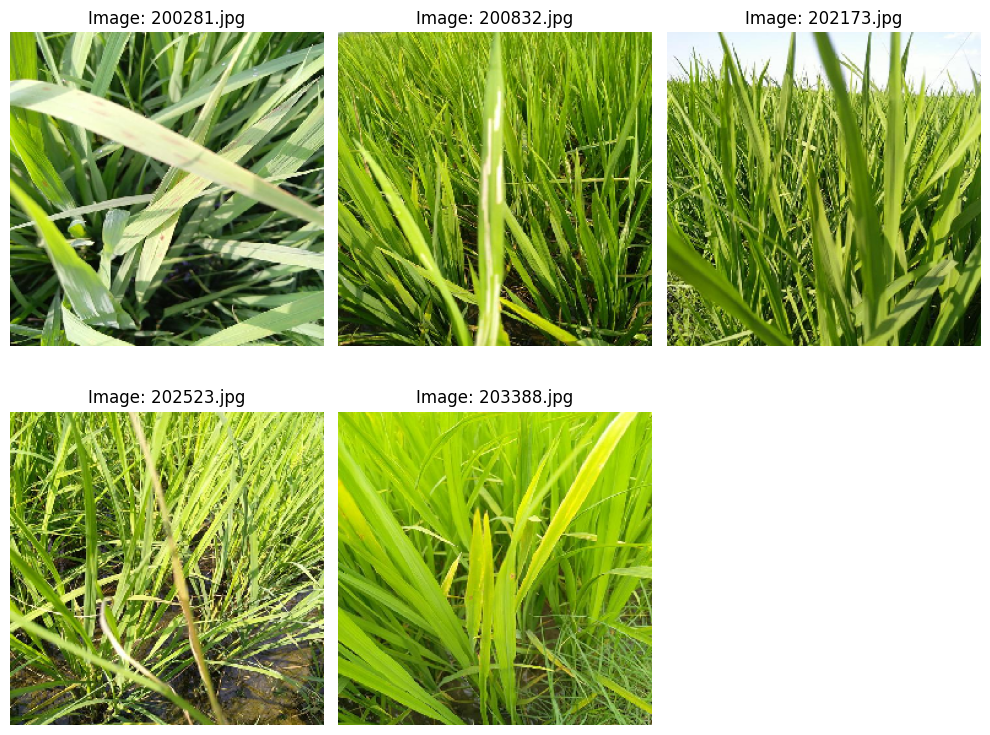

In [43]:
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image

# Directory containing the test images
test_image_dir = '/content/test_images/test_images'

# Get a list of sample image filenames
sample_images = ['200281.jpg', '200832.jpg', '202173.jpg', '202523.jpg', '203388.jpg']

# Plot the sample images
plt.figure(figsize=(10, 8))

for i, img_name in enumerate(sample_images):
    img_path = os.path.join(test_image_dir, img_name)
    img = image.load_img(img_path, target_size=(256, 256))
    plt.subplot(2, 3, i + 1)  # Create a subplot
    plt.imshow(img)
    plt.title(f"Image: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


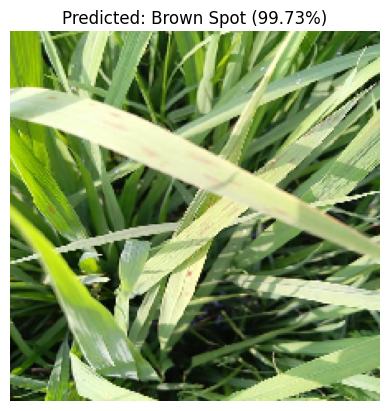

In [45]:
# Load and preprocess a sample image
image_path = '/content/test_images/test_images/200281.jpg'  # Update with any sample image path
img = image.load_img(image_path, target_size=(224, 224))  # Resize to 224x224
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array = img_array / 255.0  # Normalize

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions[0])
confidence = np.max(predictions[0])

# Class names (update as per your classes)
class_names = ['Tungro', 'Brown Spot', 'Dead Heart', 'Normal', 'Hispa', 'Blast']

# Display the image and prediction
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} ({confidence * 100:.2f}%)")
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


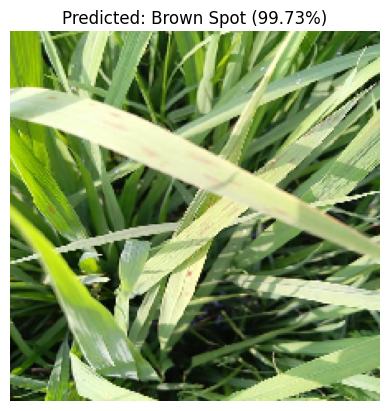

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


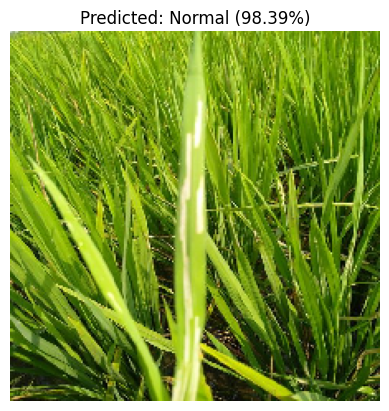

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


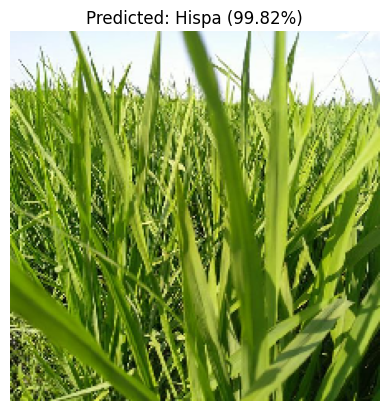

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


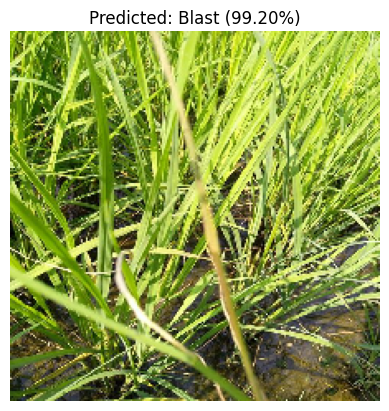

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


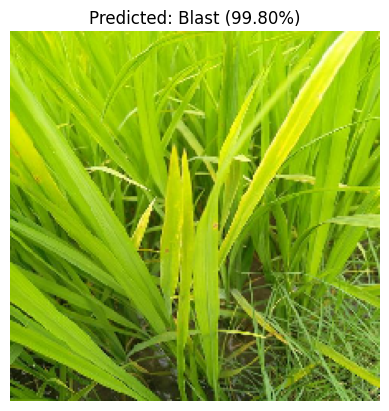

In [47]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Path to the test images folder
test_images_path = '/content/test_images/test_images'  # Updated path to the nested folder

# Class names (update as per your classes)
class_names = ['Tungro', 'Brown Spot', 'Dead Heart', 'Normal', 'Hispa', 'Blast']

# Iterate through some test images and make predictions
for img_name in os.listdir(test_images_path)[:5]:  # Adjust the number of images as needed
    image_path = os.path.join(test_images_path, img_name)

    # Check if the path is a file (not a directory)
    if os.path.isfile(image_path):
        # Load and preprocess the image
        img = image.load_img(image_path, target_size=(224, 224))  # Change to (256, 256) if needed
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = img_array / 255.0  # Normalize

        # Make a prediction
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])
        confidence = np.max(predictions[0])

        # Display the image and prediction
        plt.figure()
        plt.imshow(img)
        plt.title(f"Predicted: {class_names[predicted_class]} ({confidence * 100:.2f}%)")
        plt.axis('off')
        plt.show()
